In [1]:
import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.12.2 python-igraph==0.9.9 pynndescent==0.5.6


In [2]:
AN26 = sc.read_h5ad('/store/Projects/pantovski/IL10/Old_naive/data/Ambient_RNA_Cleaned/AN26_cleaned.h5ad')
AN27 = sc.read_h5ad('/store/Projects/pantovski/IL10/Old_naive/data/Ambient_RNA_Cleaned/AN27_cleaned.h5ad')
AN27b = sc.read_h5ad('/store/Projects/pantovski/IL10/Old_naive/data/Ambient_RNA_Cleaned/AN27b_cleaned.h5ad')
AN28 = sc.read_h5ad('/store/Projects/pantovski/IL10/Old_naive/data/Ambient_RNA_Cleaned/AN28_cleaned.h5ad')
O1 = sc.read_h5ad('/store/Projects/pantovski/IL10/Old_naive/data/Ambient_RNA_Cleaned/O1_cleaned.h5ad')
O2 = sc.read_h5ad('/store/Projects/pantovski/IL10/Old_naive/data/Ambient_RNA_Cleaned/O2_cleaned.h5ad')
O3 = sc.read_h5ad('/store/Projects/pantovski/IL10/Old_naive/data/Ambient_RNA_Cleaned/O3_cleaned.h5ad')

AN26.var_names_make_unique()
AN27.var_names_make_unique()
AN27b.var_names_make_unique()
AN28.var_names_make_unique()
O1.var_names_make_unique()
O2.var_names_make_unique()
O3.var_names_make_unique()

AN26.obs.index = AN26.obs.index.map(lambda x: x.split('-')[0]+'-1')
AN27.obs.index = AN27.obs.index.map(lambda x: x.split('-')[0]+'-2')
AN27b.obs.index = AN27b.obs.index.map(lambda x: x.split('-')[0]+'-3')
AN28.obs.index = AN28.obs.index.map(lambda x: x.split('-')[0]+'-4')
O1.obs.index = O1.obs.index.map(lambda x: x.split('-')[0]+'-5')
O2.obs.index = O2.obs.index.map(lambda x: x.split('-')[0]+'-6')
O3.obs.index = O3.obs.index.map(lambda x: x.split('-')[0]+'-7')

Old_naive_Ambient_RNA_cleaned_join_inner = ad.concat([AN26, AN27, AN27b, AN28, O1, O2, O3], label="batch", keys=["AN26", "AN27", "AN27b", "AN28", "O1", "O2", "O3"], join="inner")
Old_naive_Ambient_RNA_cleaned_join_inner.obs.loc[Old_naive_Ambient_RNA_cleaned_join_inner.obs.batch.isin(['AN26', 'AN27', 'AN27b', 'AN28', 'O1', 'O2', 'O3']), 'Type'] = 'Old_naive'

In [3]:
adata_Il10RN = Old_naive_Ambient_RNA_cleaned_join_inner[(Old_naive_Ambient_RNA_cleaned_join_inner.to_df()['Il10ra'] == 0), :]
adata_Il10 = adata_Il10RN[(adata_Il10RN.to_df()['Il10'] > 0), :]
adata_Il10N = Old_naive_Ambient_RNA_cleaned_join_inner[(Old_naive_Ambient_RNA_cleaned_join_inner.to_df()['Il10'] == 0), :]
adata_Il10ra = adata_Il10N[(adata_Il10N.to_df()['Il10ra'] > 0), :]
adata_DN = adata_Il10N[(adata_Il10N.to_df()['Il10ra'] == 0), :]
Old_naive_Ambient_RNA_cleaned_join_inner = ad.concat([adata_Il10, adata_Il10ra, adata_DN], label="IL10", keys=["IL10_Old_naive", "IL10ra_Old_naive", "DN_Old_naive"])

In [4]:
Old_naive_Ambient_RNA_cleaned_join_inner

AnnData object with n_obs × n_vars = 53631 × 32285
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10'

normalizing counts per cell
    finished (0:00:00)


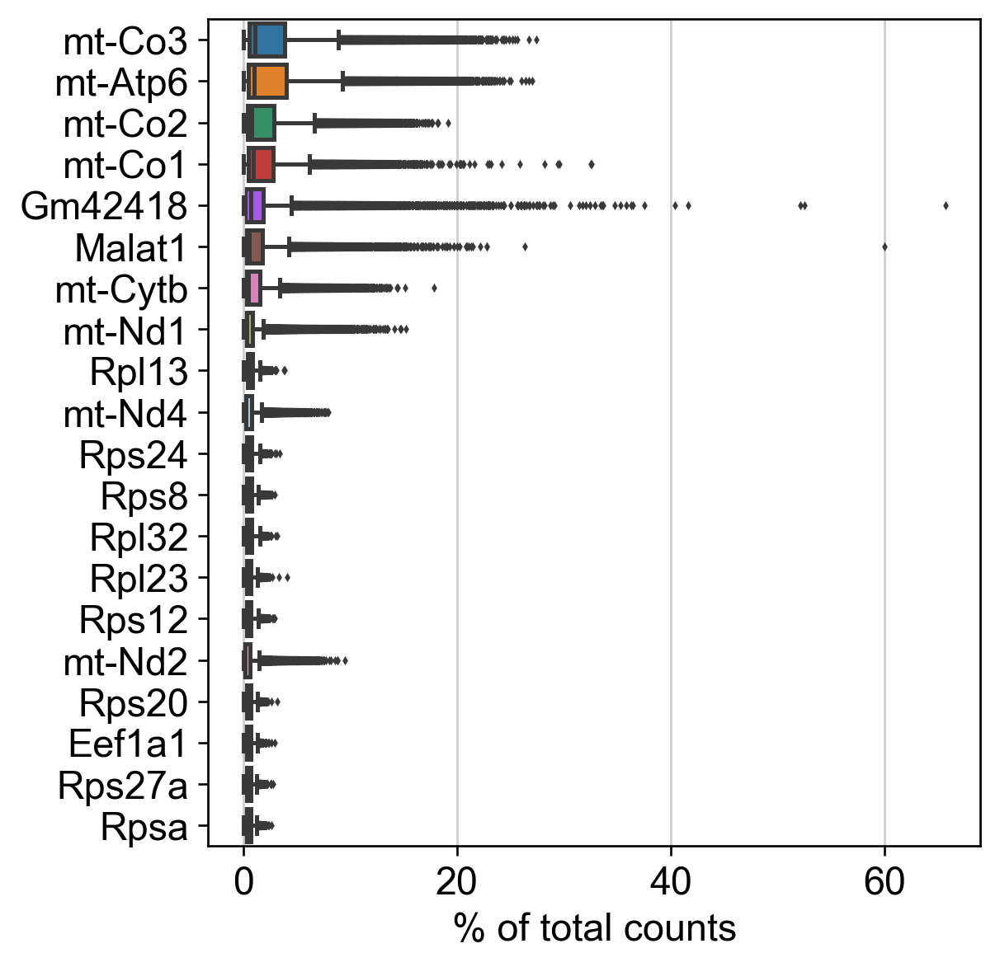

In [5]:
sc.pl.highest_expr_genes(Old_naive_Ambient_RNA_cleaned_join_inner, n_top=20)

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Type' as categorical


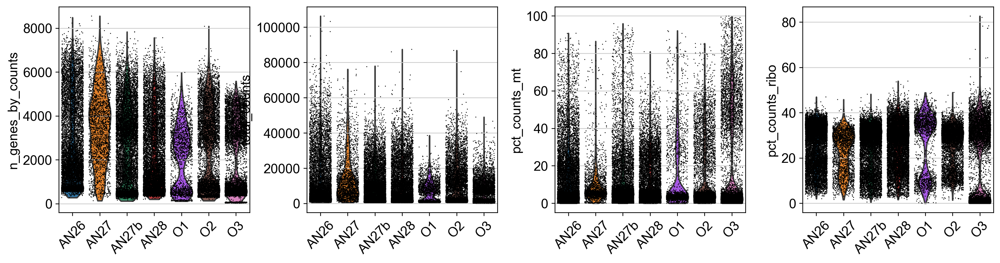

In [6]:
# mitochondrial genes
Old_naive_Ambient_RNA_cleaned_join_inner.var['mt'] = Old_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('mt-') 
# ribosomal genes
Old_naive_Ambient_RNA_cleaned_join_inner.var['ribo'] = Old_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith(("Rps","Rpl"))

sc.pp.calculate_qc_metrics(Old_naive_Ambient_RNA_cleaned_join_inner, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

# A violin plot of some of the computed quality measures:
#     the number of genes expressed in the count matrix
#     the total counts per cell
#     the percentage of counts in mitochondrial genes
#     the percentage of counts in ribosomal genes
sc.pl.violin(Old_naive_Ambient_RNA_cleaned_join_inner, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], jitter=0.4, groupby = 'batch', rotation= 45)

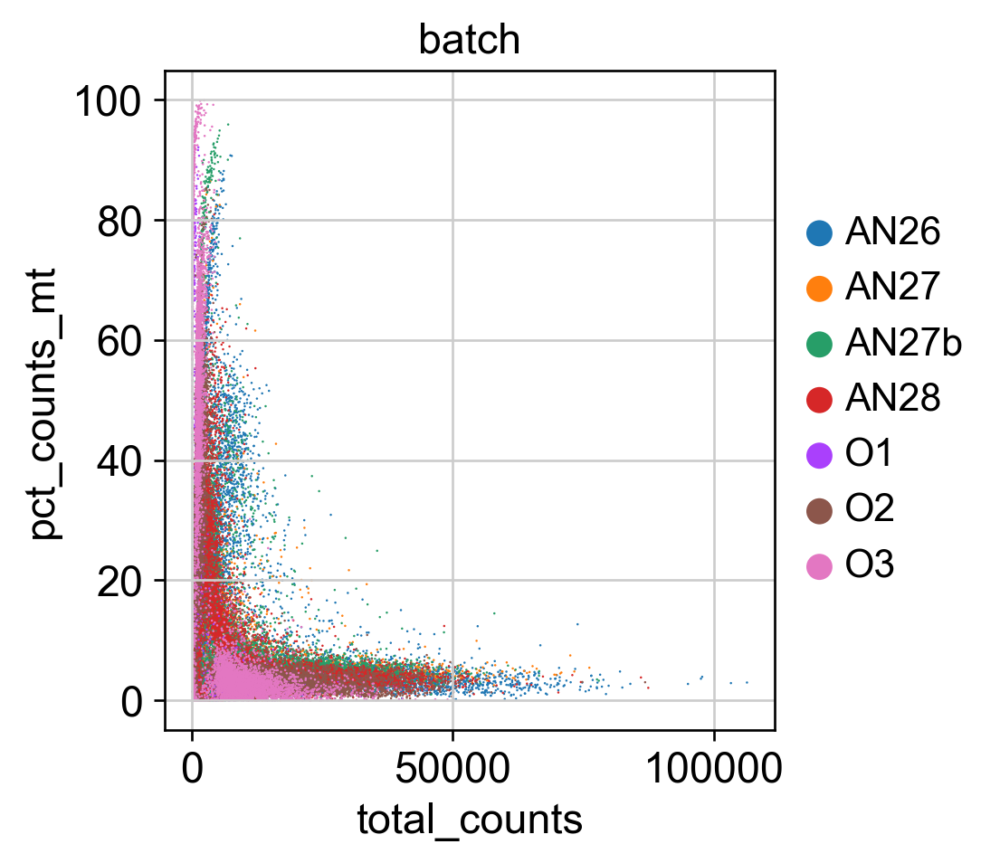

In [7]:
sc.pl.scatter(Old_naive_Ambient_RNA_cleaned_join_inner, x='total_counts', y='pct_counts_mt', color='batch')

In [8]:
#Basic filtering:
sc.pp.filter_cells(Old_naive_Ambient_RNA_cleaned_join_inner, min_genes=200)
sc.pp.filter_genes(Old_naive_Ambient_RNA_cleaned_join_inner, min_cells=3)

filtered out 552 cells that have less than 200 genes expressed
filtered out 10915 genes that are detected in less than 3 cells


In [9]:
Old_naive_Ambient_RNA_cleaned_join_inner.shape

(53079, 21370)

In [10]:
# Remove cells that have too many mitochondrial genes expressed or too little ribosomal genes expressed:
Old_naive_Ambient_RNA_cleaned_join_inner = Old_naive_Ambient_RNA_cleaned_join_inner[Old_naive_Ambient_RNA_cleaned_join_inner.obs.pct_counts_mt < 10, :]
Old_naive_Ambient_RNA_cleaned_join_inner = Old_naive_Ambient_RNA_cleaned_join_inner[Old_naive_Ambient_RNA_cleaned_join_inner.obs.pct_counts_ribo > 5, :]

In [11]:
Old_naive_Ambient_RNA_cleaned_join_inner.shape

(35190, 21370)

Trying to set attribute `.var` of view, copying.


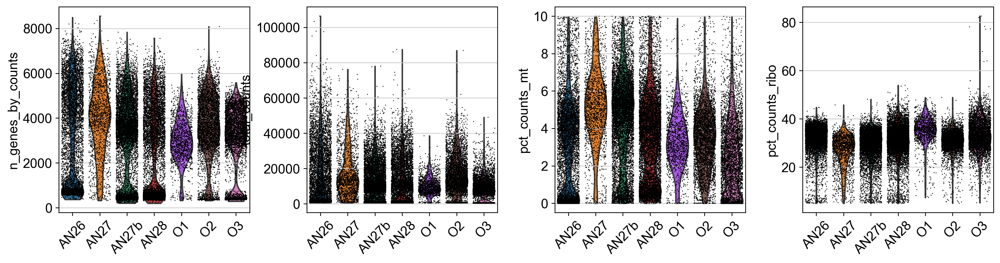

In [12]:
# mitochondrial genes
Old_naive_Ambient_RNA_cleaned_join_inner.var['mt'] = Old_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('mt-') 
# ribosomal genes
Old_naive_Ambient_RNA_cleaned_join_inner.var['ribo'] = Old_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith(("Rps","Rpl"))

sc.pp.calculate_qc_metrics(Old_naive_Ambient_RNA_cleaned_join_inner, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

sc.pl.violin(Old_naive_Ambient_RNA_cleaned_join_inner, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], jitter=0.4, groupby = 'batch', rotation= 45)

In [13]:
np.median(Old_naive_Ambient_RNA_cleaned_join_inner.obs.n_genes_by_counts)

3286.0

In [14]:
from statsmodels import robust
robust.mad(Old_naive_Ambient_RNA_cleaned_join_inner.obs.n_genes_by_counts)

2253.555372128515

In [15]:
# Old_naive_Ambient_RNA_cleaned_join_inner = Old_naive_Ambient_RNA_cleaned_join_inner[Old_naive_Ambient_RNA_cleaned_join_inner.obs.n_genes_by_counts > 1000, :]

In [16]:
# As the level of expression of mitochondrial genes and Malat1 are judged as mainly technical, it can be wise to remove them from the dataset bofore any further analysis.
malat1 = Old_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('Malat1')
Gm42418 = Old_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('Gm42418')
mito_genes = Old_naive_Ambient_RNA_cleaned_join_inner.var_names.str.startswith('mt-')

remove = np.add(mito_genes, malat1)
remove = np.add(remove, Gm42418)

keep = np.invert(remove)

Old_naive_Ambient_RNA_cleaned_join_inner_no_mt = Old_naive_Ambient_RNA_cleaned_join_inner[:,keep]

In [17]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.shape

(35190, 21355)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...


Trying to set attribute `.obs` of view, copying.


Automatically set threshold at doublet score = 0.87
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.9%
Elapsed time: 61.6 seconds


(<Figure size 960x360 with 2 Axes>,
 array([<AxesSubplot:title={'center':'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot:title={'center':'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

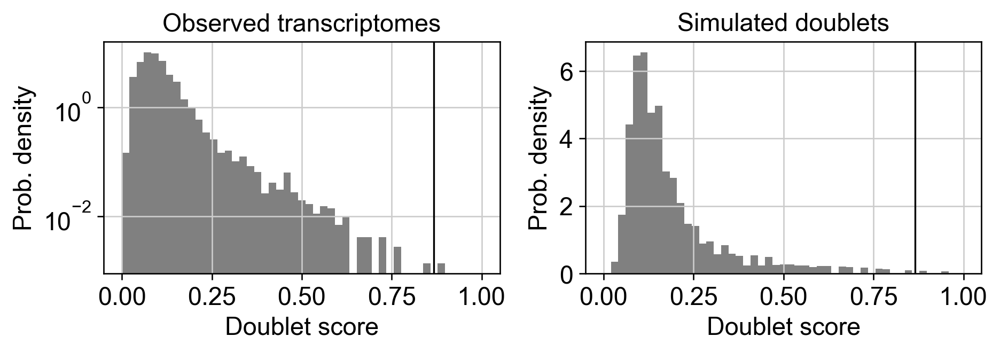

In [18]:
# Predict doublets
scrub = scr.Scrublet(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.X)
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs['doublet_scores'], Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

In [19]:
sum(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs['predicted_doublets'])

1

In [20]:
# add in column with singlet/doublet instead of True/False
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs['doublet_info'] = Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs["predicted_doublets"].astype(str)
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt = Old_naive_Ambient_RNA_cleaned_join_inner_no_mt[Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs['doublet_info'] == 'False',:]

In [21]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.shape

(35189, 21355)

In [22]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs.pop('doublet_info')
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs.pop('doublet_scores')
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.obs.pop('predicted_doublets')

AGAACCTGTTGCCGCA-1    False
CATTCATCATGAATCC-1    False
CTCCCAAGTCTCCTGT-1    False
GCAGCTGCAACCGTGC-1    False
TAGGTTGCAATGGGTG-1    False
                      ...  
TTTGTTGAGATTTGCC-7    False
TTTGTTGCAACCGATT-7    False
TTTGTTGCACTTCAAG-7    False
TTTGTTGGTTCCTTGC-7    False
TTTGTTGGTTGCTCAA-7    False
Name: predicted_doublets, Length: 35189, dtype: bool

In [23]:
# Save the result.
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.write('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_nonlognorm_join_inner_200_3_10_5_scrublet_no_mt_raw.h5ad')

In [1]:
import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.12.2 python-igraph==0.9.9 pynndescent==0.5.6


In [2]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt = sc.read_h5ad('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_nonlognorm_join_inner_200_3_10_5_scrublet_no_mt_raw.h5ad')

In [3]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent = Old_naive_Ambient_RNA_cleaned_join_inner_no_mt[:, ((Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.X > 2).sum(axis=0) / Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.shape[0] ) > 0.05]

In [4]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt

AnnData object with n_obs × n_vars = 35189 × 21355
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'batch_colors'

In [5]:
# Total-count normalize (library-size correct) the data matrix X to 10,000 reads per cell, so that counts become comparable among cells.
sc.pp.normalize_total(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt, target_sum=1e4)

# Logarithmize the data:
sc.pp.log1p(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt)

normalizing counts per cell
    finished (0:00:00)


extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


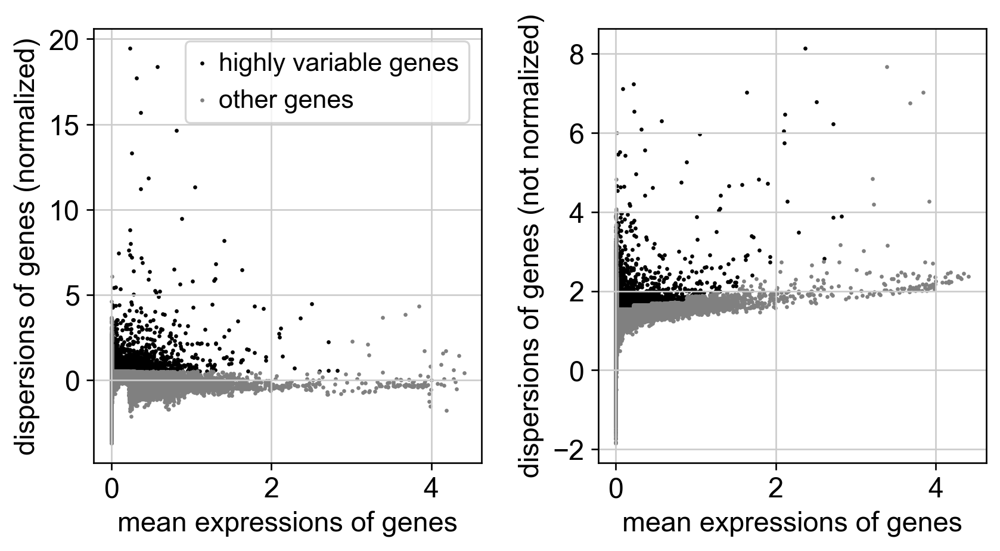

In [6]:
# Identify highly-variable genes.
sc.pp.highly_variable_genes(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt, min_mean=0.0125, max_mean=3, min_disp=0.5)

sc.pl.highly_variable_genes(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt)

In [7]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt

AnnData object with n_obs × n_vars = 35189 × 21355
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [8]:
# Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt.raw = Old_naive_Ambient_RNA_cleaned_join_inner_no_mt

# The result of the previous highly-variable-genes detection is stored as an annotation in .var.highly_variable and auto-detected by PCA and hence, sc.pp.neighbors and subsequent manifold/graph tools. In that case, the step actually do the filtering below is unnecessary, too.

# Actually do the filtering
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress = Old_naive_Ambient_RNA_cleaned_join_inner_no_mt[:, Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent.var.index]

#Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_hvgo_regress = Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent[:, Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent.var.highly_variable]
#Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress = Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent
# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use


/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


    finished (0:01:11)


In [9]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress

AnnData object with n_obs × n_vars = 35189 × 3629
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [10]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat = Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress
# BATCH CORRECTION USING ComBat
# run combat
sc.pp.combat(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, key='batch')

Standardizing Data across genes.

Found 7 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [11]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat

AnnData object with n_obs × n_vars = 35189 × 3629
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg'

In [13]:
# Save the result.
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.write('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')

In [14]:
# PCA, TSNE, UMAP and Clustering

In [112]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat = sc.read_h5ad('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.raw = Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat

df = pd.read_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_cell_types_lognorm_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_raw_SingleR.csv", index_col=0)
labels = df['labels']
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.obs['cell_type'] = labels
pd.crosstab(index=Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.obs.batch, columns=Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.obs.cell_type)

cell_type,CLP,CMP,Flk2n,Flk2p,GMP,HSC,MEP
batch,,,,,,,
AN26,95,2800,916,243,2062,698,577
AN27,120,154,240,82,446,609,37
AN27b,541,1536,784,427,2253,2281,244
AN28,440,2664,623,563,2489,1040,198
O1,42,327,221,55,85,601,30
O2,79,1159,498,198,1517,301,298
O3,326,1127,855,249,264,1309,486


In [113]:
# Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, max_value=10)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical


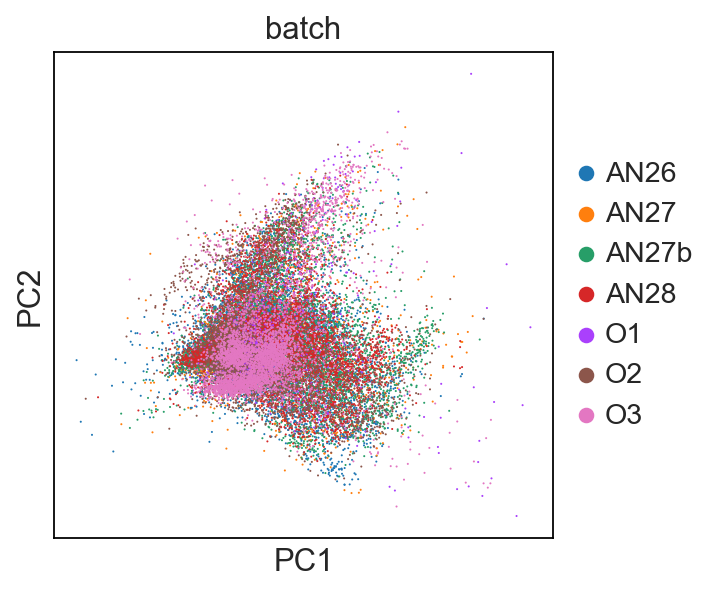

In [114]:
# Principal component analysis

# Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.
sc.tl.pca(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, svd_solver='arpack')

# We can make a scatter plot in the PCA coordinates, but we will not use that later on.
sc.pl.pca(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, color='batch')

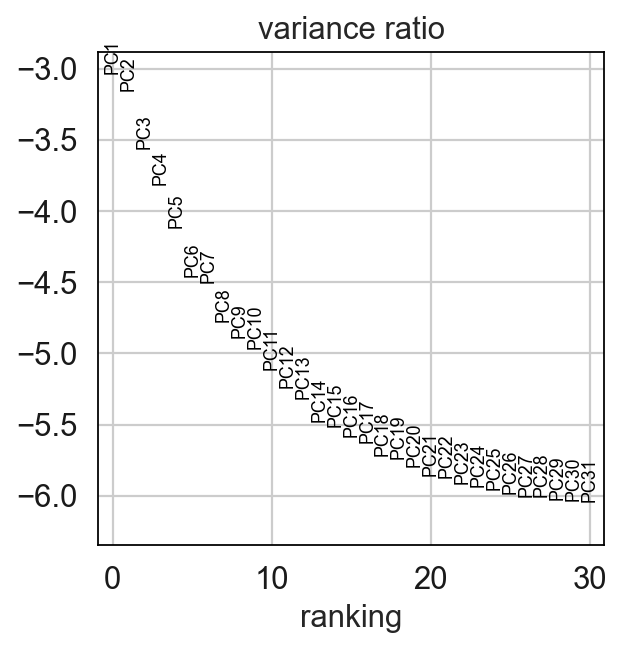

In [115]:
# Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.louvain() or tSNE sc.tl.tsne(). In our experience, often a rough estimate of the number of PCs does fine.
sc.pl.pca_variance_ratio(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, log=True)

In [116]:
# Computing the neighborhood graph

#Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat’s results, let’s take the following values.
sc.pp.neighbors(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, n_neighbors=15, n_pcs=45)

computing neighbors
    using 'X_pca' with n_pcs = 45
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE


/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:24)


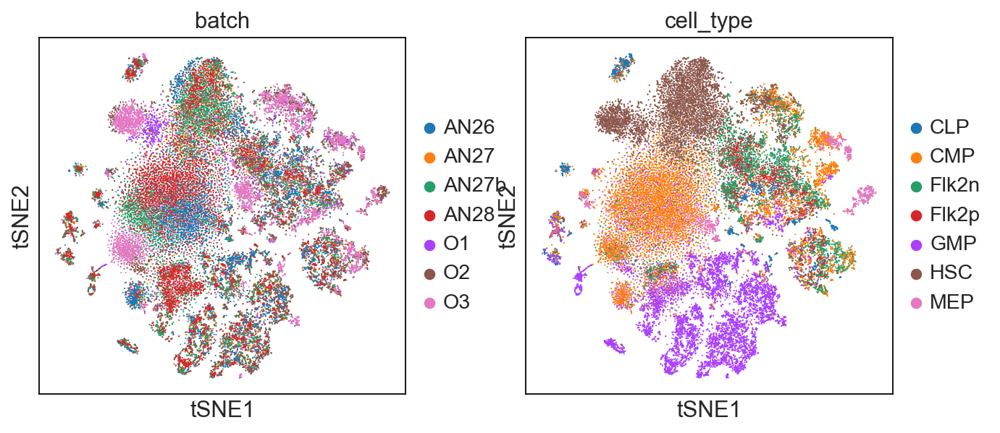

In [117]:
sc.tl.tsne(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, n_pcs = 30)

sc.pl.tsne(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, color=['batch', 'cell_type'])

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:30)


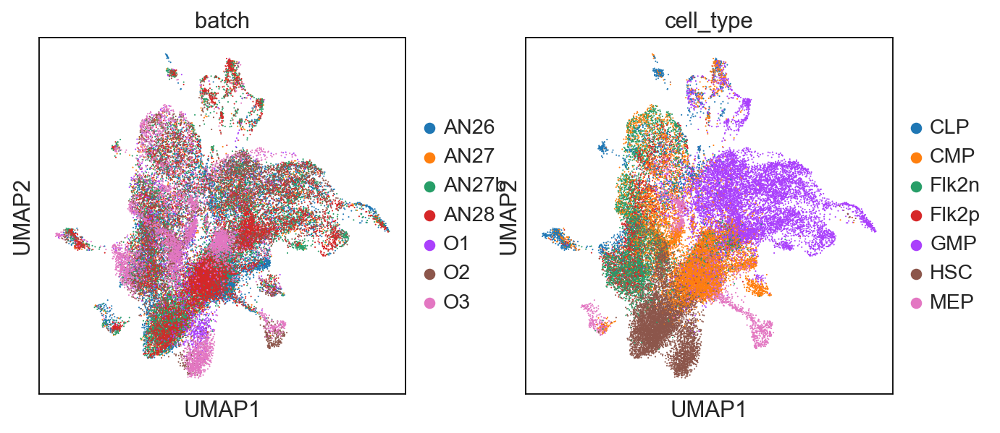

In [118]:
# Embedding the neighborhood graph

# We suggest embedding the graph in two dimensions using UMAP (McInnes et al., 2018), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

# tl.paga(adata)
# pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
# tl.umap(adata, init_pos='paga')

sc.tl.umap(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat)

sc.pl.umap(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, color=['batch', 'cell_type'])

running Leiden clustering
    finished: found 9 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:07)


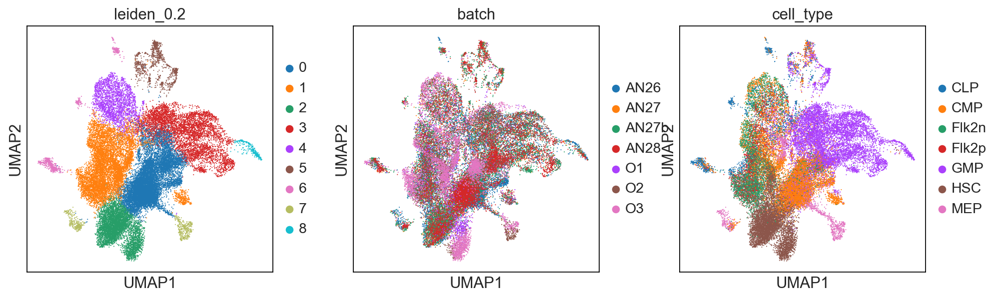

In [119]:
# Clustering the neighborhood graph

# As with Seurat and many other frameworks, we recommend the Leiden graph-clustering method (community detection based on optimizing modularity) by Traag *et al.* (2018). Note that Leiden clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.
sc.tl.leiden(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, resolution = 0.2, key_added = "leiden_0.2")

# Plot the clusters:
sc.pl.umap(Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat, color=['leiden_0.2', 'batch', 'cell_type'])

In [120]:
#Save the clusters.
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.obs.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_clusters_join_inner_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv")

In [121]:
# Save the result.
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.write('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_join_inner_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')

In [1]:
# DGE
import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc

In [2]:
Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat = sc.read_h5ad('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_join_inner_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.h5ad')

Old_naive_Ambient_RNA_cleaned_HSC = Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat[Old_naive_Ambient_RNA_cleaned_join_inner_no_mt_2_UMI_5_percent_regress_combat.obs.cell_type == 'HSC']
Old_naive_Ambient_RNA_cleaned_HSC

View of AnnData object with n_obs × n_vars = 6839 × 3629
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Type', 'IL10', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'cell_type', 'leiden_0.2'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'cell_type_colors', 'hvg', 'leiden', 'leiden_0.2_colors', 'neighbors', 'pca', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [3]:
pd.crosstab(index=Old_naive_Ambient_RNA_cleaned_HSC.obs.batch, columns=Old_naive_Ambient_RNA_cleaned_HSC.obs.IL10)

IL10,IL10_Old_naive,IL10ra_Old_naive,DN_Old_naive
batch,,,
AN26,1,89,608
AN27,1,22,586
AN27b,3,83,2195
AN28,1,36,1003
O1,0,24,577
O2,1,25,275
O3,2,35,1272


In [4]:
expression_matrix = pd.DataFrame(Old_naive_Ambient_RNA_cleaned_HSC.X)
expression_matrix.columns = Old_naive_Ambient_RNA_cleaned_HSC.var.index
expression_matrix = expression_matrix.T
gene_list = list(Old_naive_Ambient_RNA_cleaned_HSC.var.index)
column_values = pd.Series(gene_list)
expression_matrix.insert(loc=0, column='Description', value=column_values)
expression_matrix.insert(loc=0, column='NAME', value=gene_list)
expression_matrix['NAME'] = expression_matrix['NAME'].str.upper()
expression_matrix.index = range(len(expression_matrix.index))

expression_matrix.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_HSC_expression_matrix_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.txt', index=None, sep='\t', mode='a')

In [5]:
phenotype_list = list(Old_naive_Ambient_RNA_cleaned_HSC.obs.IL10)
first_row = [Old_naive_Ambient_RNA_cleaned_HSC.shape[0], '3', '1']
second_row = ['#', 'IL10_Old_naive', 'IL10ra_Old_naive', 'DN_Old_naive']

import csv

with open('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_HSC_phenotype_list_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.cls', 'w') as f:
      
    # using csv.writer method from CSV package
    write = csv.writer(f, delimiter=' ')
      
    write.writerow(first_row)
    write.writerow(second_row)
    write.writerow(phenotype_list)

In [6]:
import gseapy as gp
gene_set_names = gp.get_library_name(organism='Mouse')

In [7]:
groups = ['IL10ra_Old_naive', 'DN_Old_naive']
IL10ra_vs_DN_GSEA = Old_naive_Ambient_RNA_cleaned_HSC[Old_naive_Ambient_RNA_cleaned_HSC.obs.IL10.isin(groups)]

In [8]:
expression_matrix_IL10ra_vs_DN = pd.DataFrame(IL10ra_vs_DN_GSEA.X)
expression_matrix_IL10ra_vs_DN.columns = IL10ra_vs_DN_GSEA.var.index
expression_matrix_IL10ra_vs_DN = expression_matrix_IL10ra_vs_DN.T
gene_list = list(IL10ra_vs_DN_GSEA.var.index)
column_values = pd.Series(gene_list)
expression_matrix_IL10ra_vs_DN.insert(loc=0, column='Description', value=column_values)
expression_matrix_IL10ra_vs_DN.insert(loc=0, column='NAME', value=gene_list)
expression_matrix_IL10ra_vs_DN['NAME'] = expression_matrix_IL10ra_vs_DN['NAME'].str.upper()
expression_matrix_IL10ra_vs_DN.index = range(len(expression_matrix_IL10ra_vs_DN.index))

In [9]:
phenotype_list_IL10ra_vs_DN = list(IL10ra_vs_DN_GSEA.obs.IL10)

In [10]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Biological_Process_2021', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png',)

#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_GO_BP_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv', index=None)

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:43:30,285 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,regulation of immune response (GO:0050776),0.706991,2.487196,0.000000,0.000000,179,26,IFITM1;CLEC2D;SAMHD1;PLSCR1;TYROBP;B2M;CASP8;S...,IFITM1;CLEC2D;SAMHD1;PLSCR1;TYROBP;B2M;CASP8;S...
1,neuron projection morphogenesis (GO:0048812),0.649561,2.164554,0.000000,0.010208,140,23,ALCAM;MAP4K4;S100A6;DOCK10;IQGAP1;PTEN;TAOK1;C...,ALCAM;MAP4K4;S100A6;DOCK10;IQGAP1;PTEN;TAOK1;C...
2,response to cytokine (GO:0034097),0.566537,1.991631,0.000000,0.029166,150,42,IFITM1;PTPN18;SELP;PLSCR1;MCL1;STAT3;NFAT5;SET...,IFITM1;PTPN18;SELP;PLSCR1;MCL1;STAT3;NFAT5;SET...
3,regulation of response to external stimulus (G...,0.589299,1.982332,0.000000,0.030624,130,22,CCR2;SAMHD1;CASP8;GRN;FOXP1;STK24;CXCR4;BRD4;C...,CCR2;SAMHD1;CASP8;GRN;FOXP1;STK24;CXCR4;BRD4;C...
4,cellular response to type I interferon (GO:007...,0.731334,1.964724,0.019231,0.030624,65,16,IFITM1;SAMHD1;IRF8;IFITM3;JAK1;PSMB8;SP100;IFN...,IFITM1;SAMHD1;IRF8;IFITM3;JAK1;PSMB8;SP100;IFN...
...,...,...,...,...,...,...,...,...,...
142,organic substance transport (GO:0071702),0.438678,1.445159,0.037736,0.229162,136,23,TXNIP;GM2A;SLC18A2;RAB38;SNX4;SLC50A1;SCAMP3;C...,TXNIP;GM2A;SLC18A2;RAB38;SNX4;SLC50A1;SCAMP3
143,tRNA transport (GO:0051031),-0.512903,-1.542234,0.000000,0.229900,37,18,POM121;RANBP2;SEC13;NUP210;NUP153;NUP50;NUP62;...,SSB;RAN;NUP54;RAE1;XPOT;TOMM20;YBX1
144,maturation of SSU-rRNA (GO:0030490),-0.518143,-1.545289,0.020833,0.230701,35,19,UTP3;RPS16;NGDN;BMS1;RIOK3;RPS14;RPS28;RIOK1;L...,SNU13;WDR46;NOP14;RPS19;DCAF13;RPS8;NOB1
145,protein-containing complex disassembly (GO:003...,0.482870,1.437207,0.018868,0.234617,56,17,GABARAP;GABARAPL1;GABARAPL2;MAP1LC3B;CTNNB1;LA...,GABARAP;GABARAPL1;GABARAPL2;MAP1LC3B


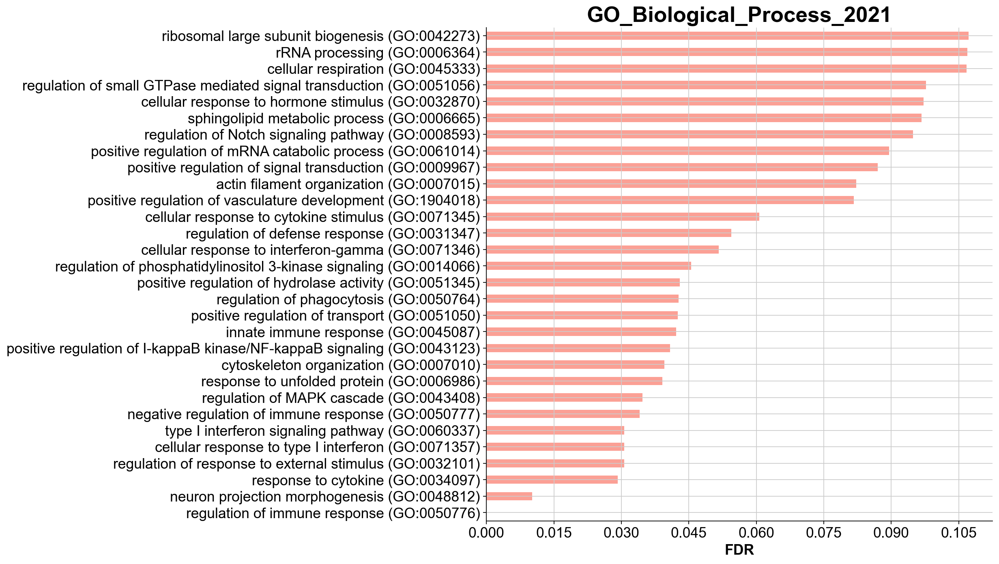

In [11]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN GSEA GO BP.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10))

In [12]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Molecular_Function_2021', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_GO_MF_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:44:02,620 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,ribosome binding (GO:0043022),-0.590362,-1.999983,0.000000,0.007745,48,27,EIF2A;NCLN;FMR1;EEF2;ERI1;SBDS;SEC61A1;SEC61B;...,SRP68;SRP72;EIF6;TMEM147;NAA10;TMCO1;ETF1;EIF2...
1,snRNA binding (GO:0017069),-0.601602,-1.841845,0.000000,0.027108,43,25,RBM7;CCNT1;CDK9;LARP7;EFTUD2;LSM2;HNRNPU;LSM8;...,SF3B3;SNRPA1;DDX21;SNRNP70;SNRPB2;LSM7;SNU13;P...
2,protease binding (GO:0002020),0.502767,1.835897,0.000000,0.027722,118,30,PSAP;FLOT1;ANXA2;PTEN;UBC;SELL;CFLAR;CST3;BIN1...,PSAP;FLOT1;ANXA2;PTEN;UBC;SELL;CFLAR;CST3
3,"DNA-binding transcription activator activity, ...",0.517301,1.863988,0.000000,0.032342,333,45,HLF;MECOM;PLSCR1;KLF6;STAT3;NFAT5;ERG;CREB1;JU...,HLF;MECOM;PLSCR1;KLF6;STAT3;NFAT5;ERG;CREB1;JU...
4,histone-lysine N-methyltransferase activity (G...,0.616752,1.869888,0.000000,0.033959,45,20,NSD2;MECOM;SETD2;ASH1L;EED;KMT2C;KMT2A;KMT2E;N...,NSD2;MECOM;SETD2;ASH1L;EED;KMT2C;KMT2A;KMT2E;N...
5,RNA polymerase II transcription regulatory reg...,0.464157,1.878854,0.000000,0.039417,1359,119,CEBPD;HLF;IRF8;MECOM;IKZF2;KLF6;STAT3;NFAT5;JU...,CEBPD;HLF;IRF8;MECOM;IKZF2;KLF6;STAT3;NFAT5;JU...
6,RNA polymerase II cis-regulatory region sequen...,0.496600,1.912135,0.000000,0.040428,1149,105,CEBPD;HLF;IRF8;MECOM;IKZF2;KLF6;STAT3;NFAT5;JU...,CEBPD;HLF;IRF8;MECOM;IKZF2;KLF6;STAT3;NFAT5;JU...
7,phosphatidylinositol binding (GO:0035091),0.569038,1.755197,0.000000,0.045481,92,17,NUMA1;FCHO2;SNX10;SNX5;SNX2;SNX4;NCF1;SNX1;PIT...,NUMA1;FCHO2;SNX10;SNX5;SNX2;SNX4;NCF1;SNX1;PITPNA
8,cysteine-type endopeptidase activity (GO:0004197),0.518806,1.739647,0.020000,0.047165,105,25,CTSH;CTSS;CASP8;CTSB;CTSC;CFLAR;USP47;CAPNS1;C...,CTSH;CTSS;CASP8;CTSB;CTSC;CFLAR;USP47;CAPNS1;C...
9,calcium ion binding (GO:0005509),0.502598,1.936121,0.000000,0.048513,348,55,TPT1;TPM4;S100A4;SELP;S100A6;PLSCR1;ANXA2;IQGA...,TPT1;TPM4;S100A4;SELP;S100A6;PLSCR1;ANXA2;IQGA...


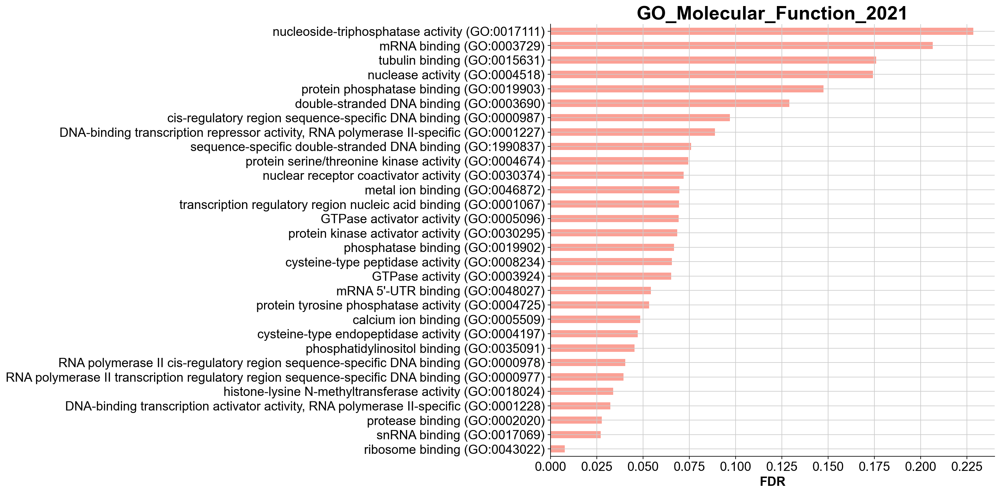

In [13]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN GSEA GO MF.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10))

In [14]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Cellular_Component_2021', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_GO_CC_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:44:22,426 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,mitochondrial inner membrane (GO:0005743),-0.461324,-2.074675,0.000000,0.000000,328,181,LGALS3;MRPL51;COX7A2L;MRPL52;MRPL33;TIMM17B;SM...,UQCRB;PHB;COX4I1;MRPS21;MRPL57;NDUFA4;MRPL45;M...
1,small-subunit processome (GO:0032040),-0.649304,-2.097410,0.000000,0.000000,37,21,UTP3;NGDN;UTP14A;WDR36;IMP3;KRR1;MPHOSPH10;FCF...,UTP18;SNU13;EMG1;IMP4;WDR46;NOP14;NOP56;DCAF13...
2,organelle inner membrane (GO:0019866),-0.438322,-2.025110,0.000000,0.002923,346,190,LGALS3;MRPL51;COX7A2L;MRPL52;LBR;MRPL33;TIMM17...,COX5B;NDUFA13;NDUFAF4;MTLN;MRPS11;MRPL40;CBX3;...
3,lysosome (GO:0005764),0.510477,2.104020,0.000000,0.007472,477,100,IFITM1;CTSH;GM2A;PSAP;CTSS;FLOT1;ANXA2;IFI30;C...,IFITM1;CTSH;GM2A;PSAP;CTSS;FLOT1;ANXA2;IFI30;C...
4,integral component of plasma membrane (GO:0005...,0.515061,2.108878,0.000000,0.011208,1454,108,CD53;ALCAM;PROCR;PTPRC;CLEC2D;ADGRL4;CCR2;SELP...,CD53;ALCAM;PROCR;PTPRC;CLEC2D;ADGRL4;CCR2;SELP...
5,tertiary granule (GO:0070820),0.547735,2.031780,0.000000,0.014010,164,53,CD53;CTSH;CTSS;LGALS3;FCER1G;B2M;RAC1;STX7;PGL...,CD53;CTSH;CTSS;LGALS3;FCER1G;B2M;RAC1;STX7;PGL...
6,trans-Golgi network (GO:0005802),0.513774,1.966541,0.000000,0.014944,239,37,CD74;GCC2;CORO7;RAC1;GRN;RAB38;TRAPPC6B;AFTPH;...,CD74;GCC2;CORO7;RAC1;GRN;RAB38;TRAPPC6B;AFTPH;...
7,lytic vacuole (GO:0000323),0.528336,1.982652,0.000000,0.015692,219,51,CTSH;PSAP;CTSS;IFI30;CTSB;LAPTM5;CTSC;GRN;RAB3...,CTSH;PSAP;CTSS;IFI30;CTSB;LAPTM5;CTSC;GRN;RAB3...
8,lysosomal membrane (GO:0005765),0.494674,1.940573,0.000000,0.016012,330,80,IFITM1;PSAP;FLOT1;ANXA2;TMEM30A;CD74;TM6SF1;SL...,IFITM1;PSAP;FLOT1;ANXA2;TMEM30A;CD74;TM6SF1;SL...
9,mitochondrial membrane (GO:0031966),-0.406024,-1.885496,0.000000,0.019289,469,224,LGALS3;MCL1;CASP8;MRPL51;COX7A2L;UBC;MRPL52;MR...,DNM1L;COX5B;NDUFA13;VDAC2;NDUFAF4;MTLN;MRPS11;...


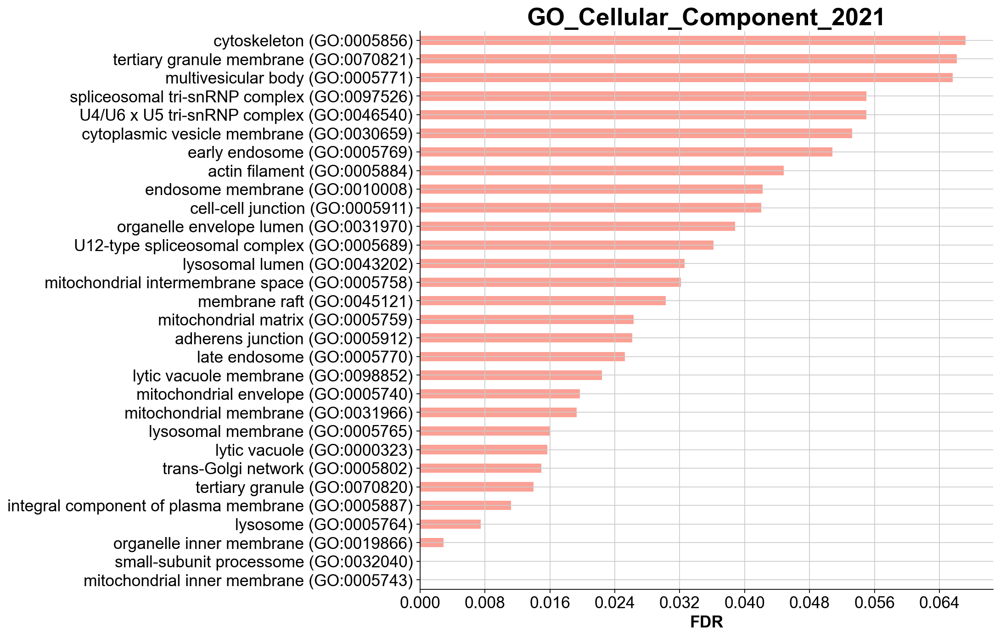

In [15]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN GSEA GO CC.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10))

In [16]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='KEGG_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_KEGG_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:44:41,165 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,Amphetamine addiction,0.707379,2.043730,0.000000,0.000000,68,17,CREB1;PPP3CA;SLC18A2;JUN;GRIA3;PRKACB;FOS;CALM...,CREB1;PPP3CA;SLC18A2;JUN;GRIA3;PRKACB;FOS
1,Apoptosis,0.508407,2.054961,0.000000,0.000000,141,51,CTSH;PIK3R1;CTSS;MCL1;CSF2RB;CASP8;CTSB;TNFRSF...,CTSH;PIK3R1;CTSS;MCL1;CSF2RB;CASP8;CTSB;TNFRSF...
2,Bacterial invasion of epithelial cells,0.615044,2.049097,0.000000,0.000000,74,29,PIK3R1;ELMO1;ARPC1B;RAC1;ARPC2;CDC42;CBL;HCLS1...,PIK3R1;ELMO1;ARPC1B;RAC1;ARPC2;CDC42;CBL;HCLS1...
3,Cell adhesion molecules (CAMs),0.688185,2.080692,0.000000,0.000000,170,25,ALCAM;PTPRC;SELP;H2-K1;SELPLG;H2-AB1;H2-D1;H2-...,ALCAM;PTPRC;SELP;H2-K1;SELPLG;H2-AB1;H2-D1;H2-...
4,GABAergic synapse,0.717340,2.120526,0.000000,0.000000,90,17,GLUL;GABARAP;GABARAPL1;GNG2;GABARAPL2;GNG10;GN...,GLUL;GABARAP;GABARAPL1;GNG2;GABARAPL2;GNG10;GN...
...,...,...,...,...,...,...,...,...,...
70,Drug metabolism,-0.455898,-1.424313,0.022222,0.181271,114,23,GSTM1;CMPK1;MGST1;RRM2;GMPS;HPRT;TK1;UCK2;GUSB...,NME4;UMPS;IMPDH2;GSTM5;GSTO1;NME2;MPO;MGST2;IT...
71,Alzheimer disease,-0.365356,-1.545475,0.000000,0.182384,175,99,CASP8;COX7A2L;TNFRSF1A;PPP3CA;APOE;NDUFS1;BID;...,ATP5G1;UQCRB;COX4I1;NDUFA4;NDUFC1;NDUFA8;ATP5A...
72,DNA replication,-0.522778,-1.528981,0.021739,0.184384,35,31,SSBP1;POLD4;RNASEH2B;POLD3;POLD2;RFC4;POLE4;RF...,RFC3;RFC5;PCNA;RNASEH2C;MCM6;DNA2;MCM4;RFC1;PO...
73,Spliceosome,-0.391897,-1.638685,0.000000,0.186297,132,107,SYF2;PUF60;TRA2A;CCDC12;SRSF5;SNRPG;SNW1;EIF4A...,PPIE;SNRNP27;AQR;SF3B3;RBM25;SNRPA1;SNRNP70;CW...


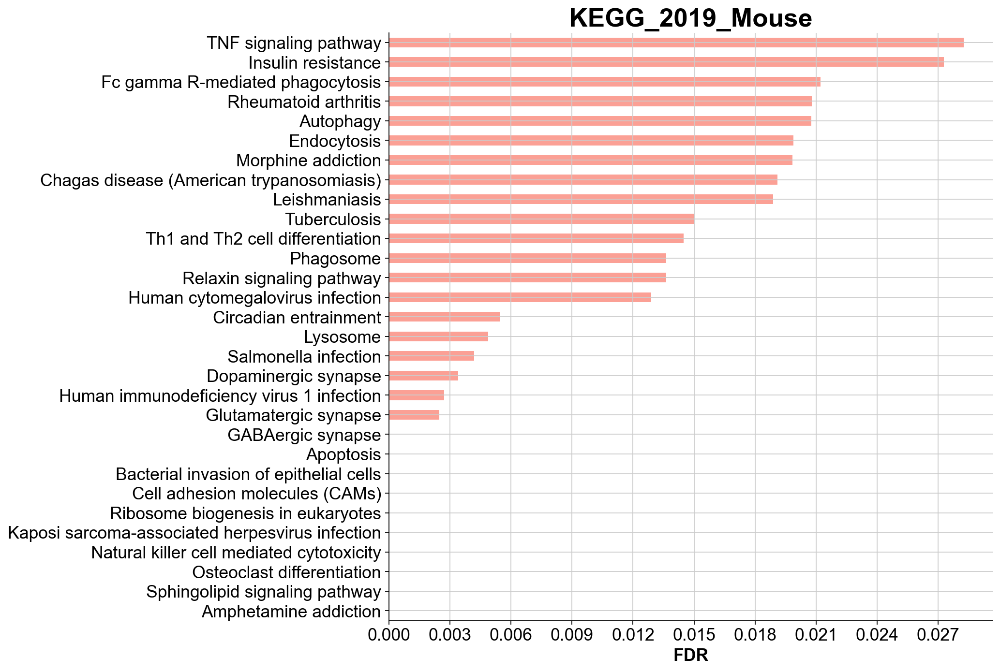

In [17]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN GSEA KEGG.png')

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10))

In [18]:
gs_res_IL10ra_vs_DN = gp.gsea(data=expression_matrix_IL10ra_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='WikiPathways_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10ra_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10ra_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_GSEA_WIKI_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10ra_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:44:58,743 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,G1 to S cell cycle control WP413,-0.541770,-1.721185,0.022727,0.038745,61,31,CDKN2D;CCND3;CDK1;TFDP2;ORC6;TRP53;RPA1;CDC45;...,PCNA;CCNH;MCM6;MCM4;TFDP1;MCM7;PRIM1;RPA2;CDK6...
1,Purine metabolism WP2185,-0.432029,-1.744831,0.000000,0.055211,171,55,GDA;POLR2A;PNP;POLR2I;POLD4;RRM2;POLR2G;DGUOK;...,NME4;POLR3H;GUK1;NT5C3;IMPDH2;POLR2E;NUDT5;POL...
2,Electron Transport Chain WP295,-0.490113,-1.817658,0.000000,0.058117,103,74,COX7A2L;NDUFS1;ATP5D;NDUFA6;NDUFB7;NDUFA1;UCP2...,UQCRB;COX4I1;NDUFA4;ATP5K;NDUFC1;NDUFA8;ATP5A1...
3,Chemokine signaling pathway WP2292,0.467755,1.687694,0.000000,0.058698,190,50,PIK3R1;CCR2;DOCK2;STAT3;GNG2;ELMO1;GRK2;RAC1;G...,PIK3R1;CCR2;DOCK2;STAT3;GNG2;ELMO1;GRK2;RAC1;G...
4,EGFR1 Signaling Pathway WP572,0.460637,1.783451,0.000000,0.062891,178,60,PIK3R1;RPS6KA3;PLSCR1;STAT3;JUND;EEF1A1;CREB1;...,PIK3R1;RPS6KA3;PLSCR1;STAT3;JUND;EEF1A1;CREB1;...
5,Apoptosis WP1254,0.509780,1.702481,0.043478,0.066385,81,28,PIK3R1;MCL1;CASP8;TNFRSF1A;JUN;CFLAR;BID;RIPK1...,PIK3R1;MCL1;CASP8;TNFRSF1A;JUN;CFLAR;BID;RIPK1...
6,IL-3 Signaling Pathway WP373,0.464982,1.719906,0.000000,0.069879,100,42,PIK3R1;SELP;STAT3;SPI1;CSF2RB;CREB1;RAC1;JAK1;...,PIK3R1;SELP;STAT3;SPI1;CSF2RB;CREB1;RAC1;JAK1;...
7,G Protein Signaling Pathways WP232,0.523103,1.646084,0.000000,0.072208,92,25,AKAP13;GNA13;PPP3CA;GNG10;GNAI2;PRKACB;NRAS;RH...,AKAP13;GNA13;PPP3CA;GNG10;GNAI2;PRKACB;NRAS;RH...
8,IL-5 Signaling Pathway WP151,0.449741,1.612067,0.043478,0.091840,69,40,PIK3R1;PIM1;STAT3;CSF2RB;RAC1;JUN;JAK1;ALOX5AP...,PIK3R1;PIM1;STAT3;CSF2RB;RAC1;JUN;JAK1;ALOX5AP...
9,Insulin Signaling WP65,0.483655,1.822759,0.018182,0.097830,159,43,MAP4K4;PIK3R1;RPS6KA3;FLOT1;XBP1;PTEN;RAC1;JUN...,MAP4K4;PIK3R1;RPS6KA3;FLOT1;XBP1;PTEN;RAC1;JUN...


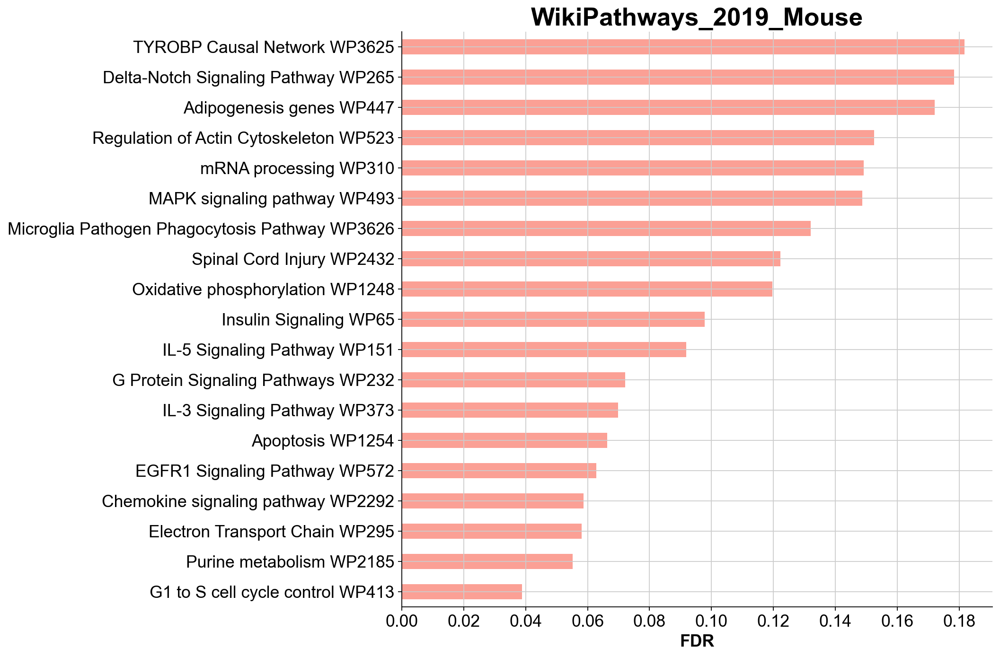

In [19]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN GSEA WIKI.png')

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10))

In [20]:
groups = ['IL10_Old_naive', 'DN_Old_naive']
IL10_vs_DN_GSEA = Old_naive_Ambient_RNA_cleaned_HSC[Old_naive_Ambient_RNA_cleaned_HSC.obs.IL10.isin(groups)]

In [21]:
expression_matrix_IL10_vs_DN = pd.DataFrame(IL10_vs_DN_GSEA.X)
expression_matrix_IL10_vs_DN.columns = IL10_vs_DN_GSEA.var.index
expression_matrix_IL10_vs_DN = expression_matrix_IL10_vs_DN.T
gene_list = list(IL10_vs_DN_GSEA.var.index)
column_values = pd.Series(gene_list)
expression_matrix_IL10_vs_DN.insert(loc=0, column='Description', value=column_values)
expression_matrix_IL10_vs_DN.insert(loc=0, column='NAME', value=gene_list)
expression_matrix_IL10_vs_DN['NAME'] = expression_matrix_IL10_vs_DN['NAME'].str.upper()
expression_matrix_IL10_vs_DN.index = range(len(expression_matrix_IL10_vs_DN.index))

In [22]:
phenotype_list_IL10_vs_DN = list(IL10_vs_DN_GSEA.obs.IL10)

In [23]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Biological_Process_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png',)

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_GO_BP_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv', index=None)

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:45:14,692 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,regulation of Wnt signaling pathway (GO:0030111),0.675876,2.135830,0.0,0.000000,111,21,HHEX;SMARCA4;WLS;CDC73;PPP1CA;APP;VGLL4;RACK1;...,HHEX;SMARCA4;WLS;CDC73;PPP1CA;APP;VGLL4;RACK1;...
1,regulation of erythrocyte differentiation (GO:...,0.655677,2.004910,0.0,0.046763,37,16,STAT1;STAT3;TAL1;NCKAP1L;CDK6;SPI1;ZFPM1;MED1;...,STAT1;STAT3;TAL1;NCKAP1L;CDK6;SPI1;ZFPM1
2,response to cytokine (GO:0034097),0.534103,1.919828,0.0,0.128599,150,42,SELP;STAT1;STAT3;PLSCR1;RHOA;CDK9;PTPN18;IRAK1...,SELP;STAT1;STAT3;PLSCR1;RHOA;CDK9;PTPN18;IRAK1...


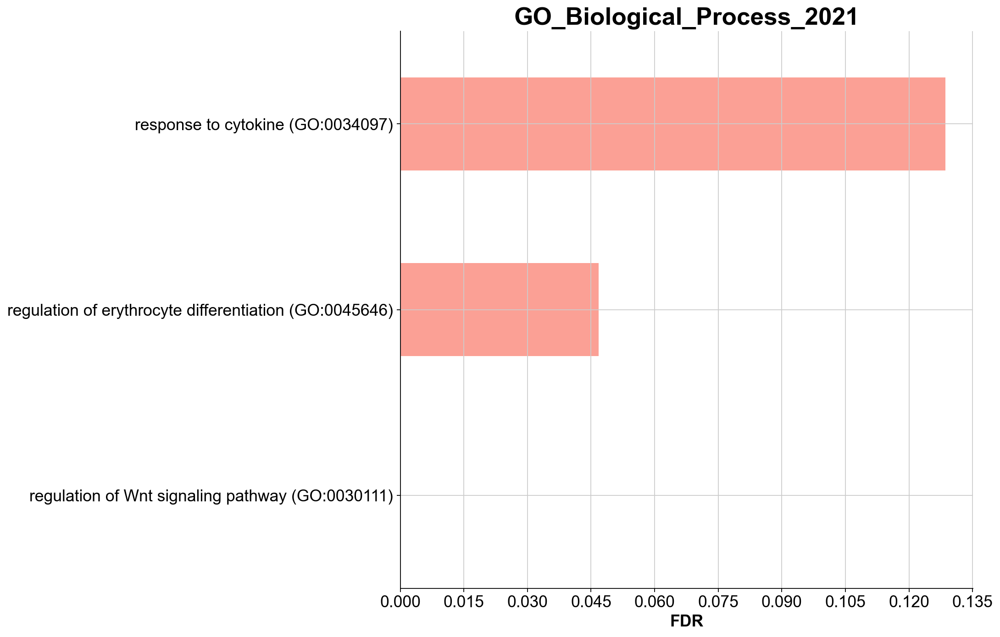

In [24]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN GSEA GO BP.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10))

In [25]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Molecular_Function_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_GO_MF_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:45:43,653 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,histone methyltransferase activity (GO:0042054),0.666605,1.859271,0.0,0.174044,32,15,KMT5A;EHMT1;SMYD2;PRMT5;EHMT2;PRMT7;KMT2E;PRMT...,KMT5A;EHMT1;SMYD2;PRMT5;EHMT2


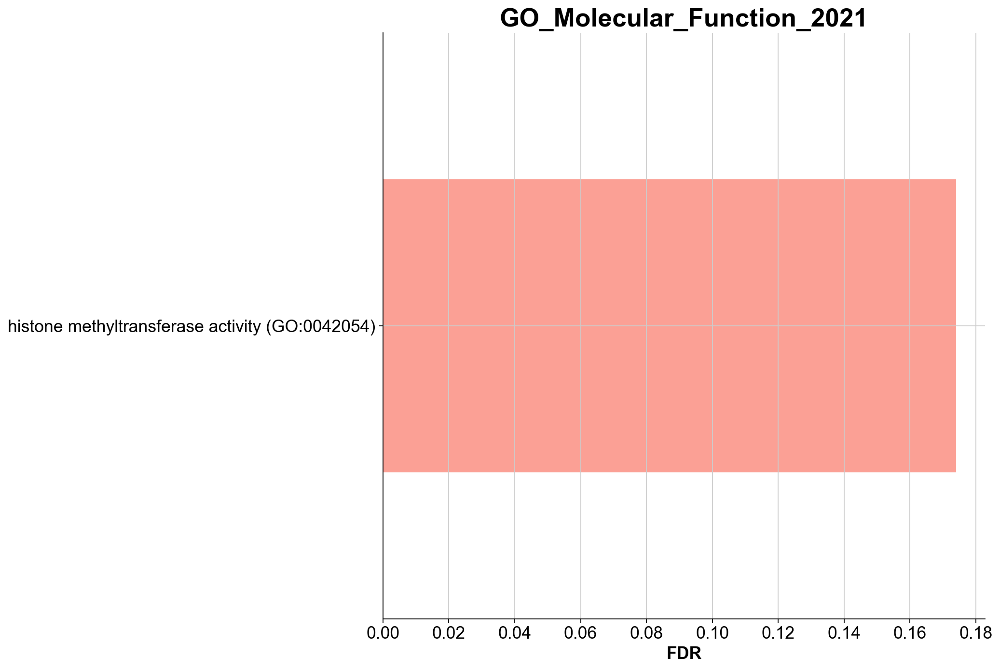

In [26]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN GSEA GO MF.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10))

In [27]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Cellular_Component_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_GO_CC_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:46:02,001 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes


In [28]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN GSEA GO CC.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [29]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='KEGG_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_KEGG_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:46:53,603 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes


In [30]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN GSEA KEGG.png')

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [31]:
gs_res_IL10_vs_DN = gp.gsea(data=expression_matrix_IL10_vs_DN, # or data='./P53_resampling_data.txt'
                 gene_sets='WikiPathways_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_DN, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_DN.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_GSEA_WIKI_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_DN.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:47:52,416 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes


In [32]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN GSEA WIKI.png')

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [33]:
groups = ['IL10_Old_naive', 'IL10ra_Old_naive']
IL10_vs_IL10ra_GSEA = Old_naive_Ambient_RNA_cleaned_HSC[Old_naive_Ambient_RNA_cleaned_HSC.obs.IL10.isin(groups)]

In [34]:
expression_matrix_IL10_vs_IL10ra = pd.DataFrame(IL10_vs_IL10ra_GSEA.X)
expression_matrix_IL10_vs_IL10ra.columns = IL10_vs_IL10ra_GSEA.var.index
expression_matrix_IL10_vs_IL10ra = expression_matrix_IL10_vs_IL10ra.T
gene_list = list(IL10_vs_IL10ra_GSEA.var.index)
column_values = pd.Series(gene_list)
expression_matrix_IL10_vs_IL10ra.insert(loc=0, column='Description', value=column_values)
expression_matrix_IL10_vs_IL10ra.insert(loc=0, column='NAME', value=gene_list)
expression_matrix_IL10_vs_IL10ra['NAME'] = expression_matrix_IL10_vs_IL10ra['NAME'].str.upper()
expression_matrix_IL10_vs_IL10ra.index = range(len(expression_matrix_IL10_vs_IL10ra.index))

In [35]:
phenotype_list_IL10_vs_IL10ra = list(IL10_vs_IL10ra_GSEA.obs.IL10)

In [36]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Biological_Process_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png',)

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_GO_BP_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv', index=None)

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:48:17,182 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,regulation of Wnt signaling pathway (GO:0030111),0.665471,2.163454,0.0,0.000000,111,21,SMARCA4;HHEX;WLS;RACK1;PPP1CA;APP;CDC73;ATP6AP...,SMARCA4;HHEX;WLS;RACK1;PPP1CA;APP;CDC73;ATP6AP...
1,regulation of protein secretion (GO:0050708),0.570055,1.891926,0.0,0.220124,125,20,DNM1L;TMED10;EZR;DNAJC1;PPID;IER3IP1;ENSA;STXB...,DNM1L;TMED10;EZR;DNAJC1;PPID;IER3IP1;ENSA;STXB...
2,positive regulation of protein secretion (GO:0...,0.624540,1.915487,0.0,0.232754,72,15,DNM1L;WLS;TMED10;EZR;PSMD9;PPID;IER3IP1;ATP13A...,DNM1L;WLS;TMED10;EZR;PSMD9;PPID;IER3IP1;ATP13A...


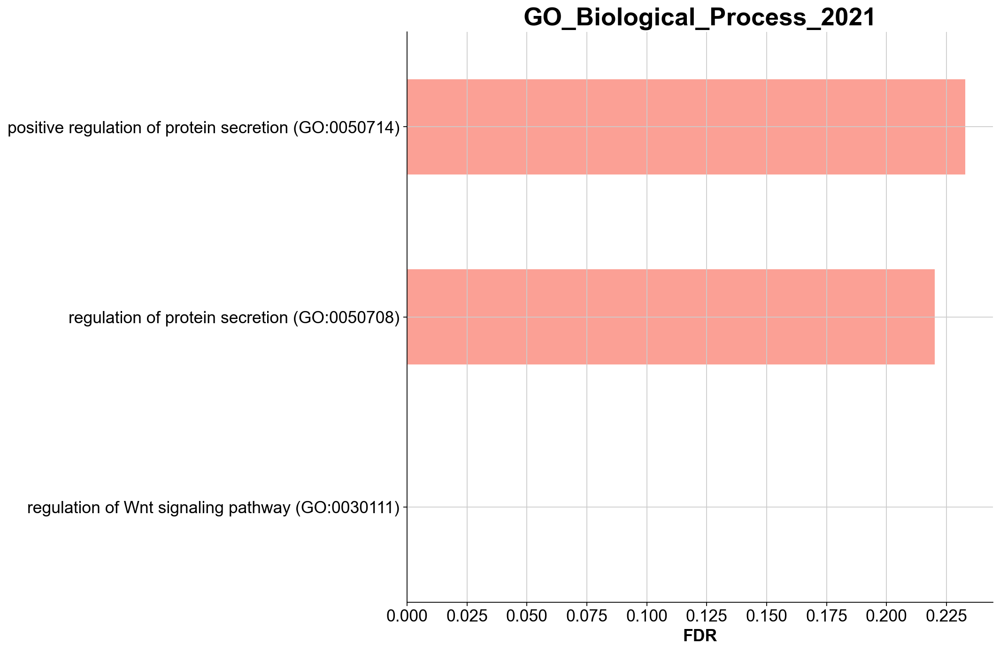

In [37]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs IL10ra GSEA GO BP.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Biological_Process_2021', figsize=(10,10))

In [38]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Molecular_Function_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_GO_MF_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:48:33,631 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
0,snRNA binding (GO:0017069),0.614013,1.988892,0.000000,0.005701,43,25,SNRPB2;LSM4;SNRPA1;RBM7;EIF5A;NCBP2;CDK9;LSM7;...,SNRPB2;LSM4;SNRPA1;RBM7;EIF5A;NCBP2;CDK9;LSM7;...
1,RNA polymerase II complex binding (GO:0000993),0.641556,2.031743,0.000000,0.011403,32,16,CTR9;URI1;SMYD2;CDC73;RTRAF;WDR43;DHX9;GTF2B;E...,CTR9;URI1;SMYD2;CDC73;RTRAF;WDR43;DHX9
2,basal RNA polymerase II transcription machiner...,0.636049,1.944602,0.000000,0.011403,33,16,CTR9;URI1;SMYD2;CDC73;RTRAF;WDR43;DHX9;LLPH;DR...,CTR9;URI1;SMYD2;CDC73;RTRAF;WDR43;DHX9
3,ribosome binding (GO:0043022),0.508931,1.875086,0.000000,0.025656,48,27,EIF2A;SRP19;SERBP1;RACK1;TMCO1;OXA1L;SEC61A1;R...,EIF2A;SRP19;SERBP1;RACK1;TMCO1;OXA1L;SEC61A1;R...
4,RNA polymerase core enzyme binding (GO:0043175),0.584840,1.791440,0.000000,0.038769,33,15,CTR9;URI1;SMYD2;CDC73;RTRAF;WDR43;DHX9;GTF2B;E...,CTR9;URI1;SMYD2;CDC73;RTRAF;WDR43;DHX9
5,histone methyltransferase activity (GO:0042054),0.567676,1.587995,0.030303,0.159639,32,15,KMT5A;EHMT1;SMYD2;EHMT2;PRMT5;PRMT1;FBL;PRMT7;...,KMT5A;EHMT1;SMYD2;EHMT2;PRMT5


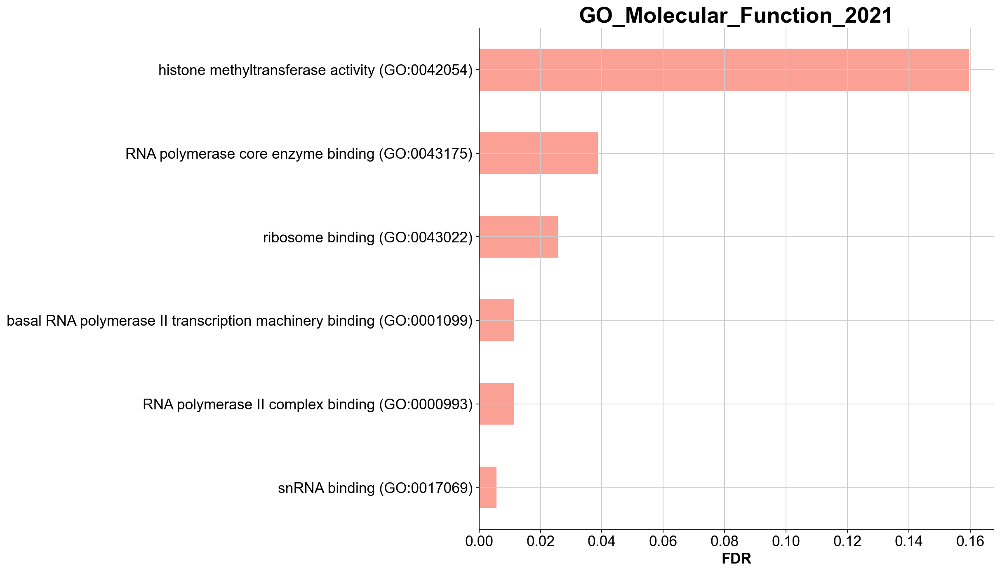

In [39]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs IL10ra GSEA GO MF.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Molecular_Function_2021', figsize=(10,10))

In [40]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='GO_Cellular_Component_2021', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_GO_CC_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:48:38,896 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes


In [41]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs IL10ra GSEA GO CC.png')

gp.barplot(top30, column='FDR', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [42]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='KEGG_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')


#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_KEGG_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:49:19,597 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes


In [43]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs IL10ra GSEA KEGG.png')

gp.barplot(top30, column='FDR', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [44]:
gs_res_IL10_vs_IL10ra = gp.gsea(data=expression_matrix_IL10_vs_IL10ra, # or data='./P53_resampling_data.txt'
                 gene_sets='WikiPathways_2019_Mouse', # enrichr library names
                 cls= phenotype_list_IL10_vs_IL10ra, # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 min_size = 15,
                 max_size = 500,
                 format='png')

#access the dataframe results throught res2d attribute
gs_res_IL10_vs_IL10ra.res2d.to_csv('/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_GSEA_WIKI_join_inner_outer_200_3_10_5_scrublet_2_UMI_5_percent_regress_combat_raw_SingleR.csv')

significant_terms = gs_res_IL10_vs_IL10ra.res2d
significant_terms = significant_terms[significant_terms.pval < 0.05]
significant_terms = significant_terms[significant_terms.fdr < 0.25]
significant_terms.reset_index(inplace=True)
significant_terms

2022-05-05 12:49:29,041 Warning: Input data contains NA, filled NA with 0


,Term,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes


In [45]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

top30 = significant_terms.sort_values('fdr', ascending=True).head(30)

top30.rename(columns={'fdr':'FDR'}, inplace=True)

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs IL10ra GSEA WIKI.png')

gp.barplot(top30, column='FDR', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [3]:
sc.tl.rank_genes_groups(Old_naive_Ambient_RNA_cleaned_HSC, 'IL10', groups = ['IL10ra_Old_naive'], reference = 'DN_Old_naive', method='wilcoxon', corr_method='bonferroni', key_added = 'wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN', use_raw=False)
result = Old_naive_Ambient_RNA_cleaned_HSC.uns['wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals', 'pvals_adj']}).head(10)

Trying to set attribute `._uns` of view, copying.
/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


,IL10ra_Old_naive_n,IL10ra_Old_naive_p
0,Alcam,5.591477e-09
1,Glul,2.884753e-08
2,Ifitm1,5.001827e-08
3,Tpm4,2.009356e-07
4,Txnip,3.383628e-07
5,Cd53,3.678635e-07
6,Tpt1,3.764422e-07
7,Ighm,1.054214e-06
8,Samsn1,8.698988e-06
9,Ctss,1.079168e-05


In [4]:
volcano_Old_naive_Ambient_RNA_cleaned_HSC = sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group=None, key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN')
volcano_Old_naive_Ambient_RNA_cleaned_HSC.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [5]:
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered = volcano_Old_naive_Ambient_RNA_cleaned_HSC[volcano_Old_naive_Ambient_RNA_cleaned_HSC['pvals_adj'] < 0.05]
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.reset_index(inplace=True, drop=True)
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_005_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered

/tmp/ipykernel_1365167/2554784064.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])


,names,scores,logfoldchanges,pvals,pvals_adj,log_pvals_adj
0,Alcam,7.070769,1.802059,1.540776e-12,5.591477e-09,8.252473
1,Glul,6.839461,1.080554,7.949167e-12,2.884753e-08,7.539891
2,Ifitm1,6.760170,0.739130,1.378294e-11,5.001827e-08,7.300871
3,Tpm4,6.555732,NaN,5.536941e-11,2.009356e-07,6.696943
4,Txnip,6.477526,0.563696,9.323859e-11,3.383628e-07,6.470617
...,...,...,...,...,...,...
64,Car2,-5.720546,-0.874775,1.061826e-08,3.853365e-05,4.414160
65,Rps17,-5.876079,NaN,4.200977e-09,1.524535e-05,4.816863
66,Ppia,-5.997945,0.697683,1.998302e-09,7.251840e-06,5.139552
67,Rpl41,-6.302097,0.931974,2.936457e-10,1.065640e-06,5.972389


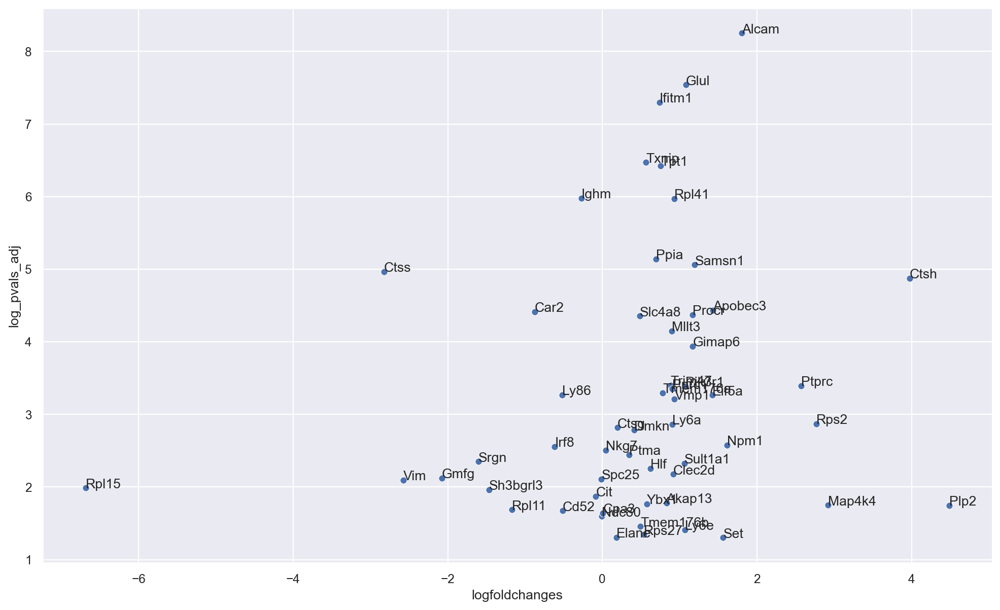

In [49]:
import matplotlib.pylab as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered, x='logfoldchanges', y= 'log_pvals_adj')
for line in range(0,volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.shape[0]):
     plt.text(volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.logfoldchanges[line], volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.log_pvals_adj[line], volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.names[line])
plt.show()

In [7]:
import gseapy
gene_set_names = gseapy.get_library_name(organism='Mouse')

In [8]:
glist_Old_naive = sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group='IL10ra_Old_naive', key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN', pval_cutoff=0.05, log2fc_min=0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Old_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [12]:
sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group='IL10ra_Old_naive', key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN', pval_cutoff=0.05, log2fc_min=0.000000000001).shape

(41, 5)

In [52]:
significant_terms.shape

(26, 10)

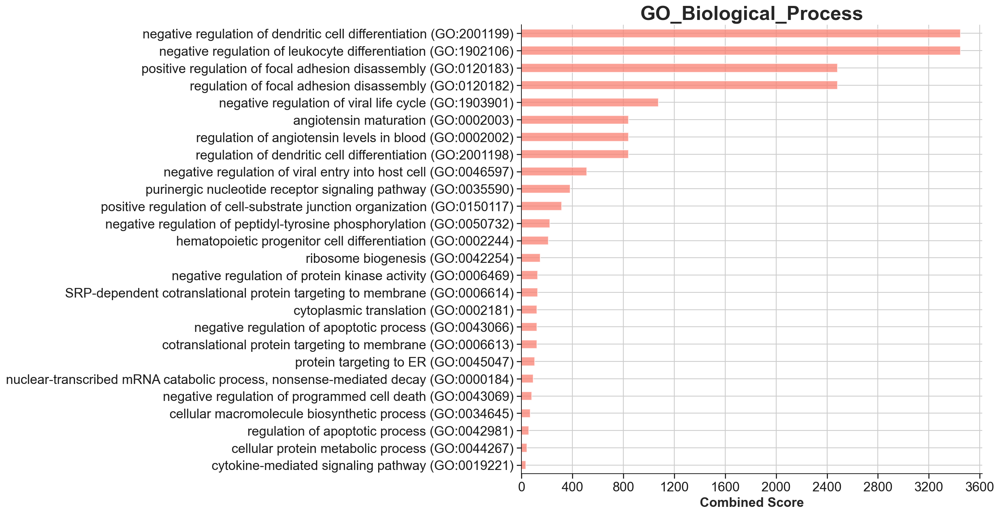

In [53]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN Upregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [54]:
enr_res_Old_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-05 12:49:46,060 Warning: No enrich terms using library GO_Molecular_Function_2021 when cutoff = 0.05


In [55]:
significant_terms.shape

(0, 10)

In [56]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN Upregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [57]:
enr_res_Old_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [58]:
significant_terms.shape

(6, 10)

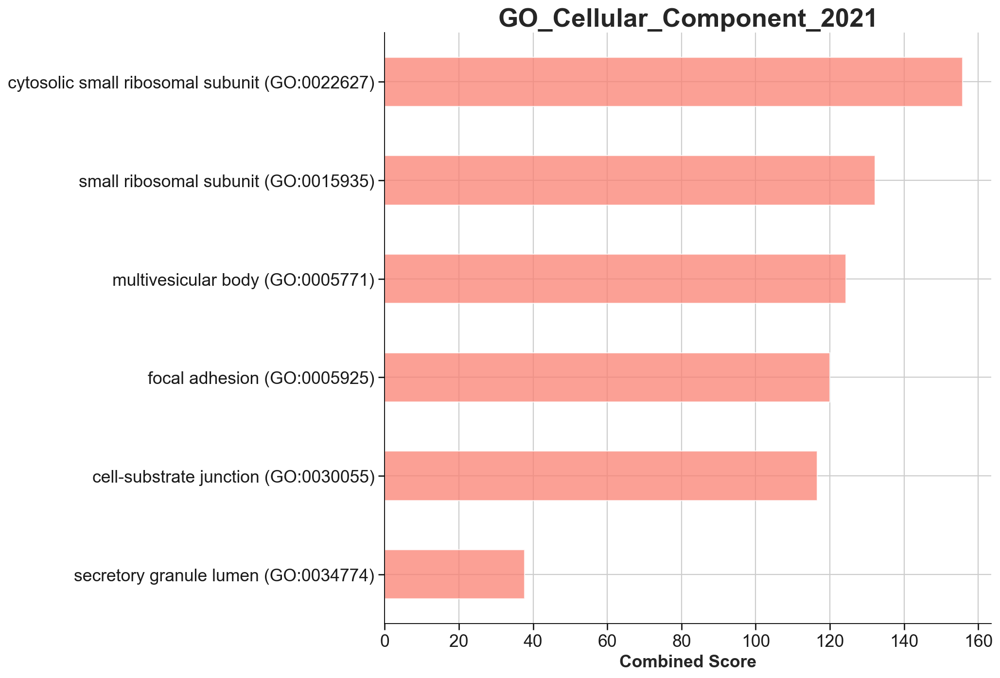

In [59]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN Upregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [60]:
enr_res_Old_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-05 12:50:21,328 Warning: No enrich terms using library KEGG_2019_Mouse when cutoff = 0.05


In [61]:
significant_terms.shape

(0, 10)

In [62]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN Upregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [63]:
enr_res_Old_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_upregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [64]:
significant_terms.shape

(1, 10)

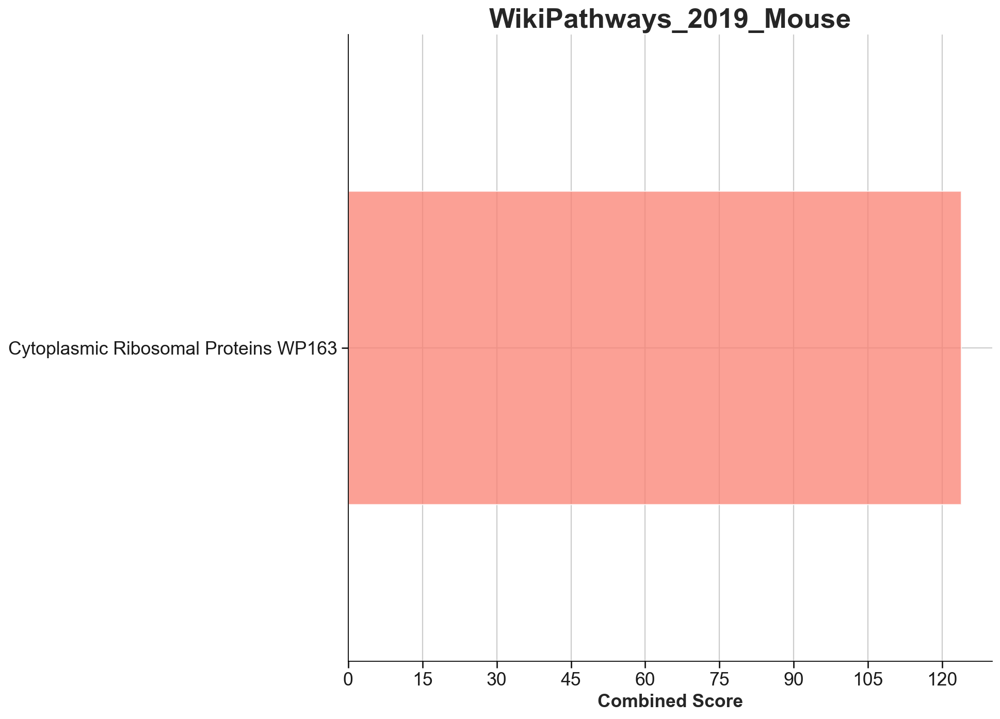

In [65]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN Upregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [66]:
glist_Old_naive = sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group='IL10ra_Old_naive', key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN', pval_cutoff=0.05, log2fc_max=-0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Old_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-05 12:50:35,660 Warning: No enrich terms using library GO_Biological_Process_2021 when cutoff = 0.05


In [13]:
sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group='IL10ra_Old_naive', key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN', pval_cutoff=0.05, log2fc_max=-0.000000000001).shape

(15, 5)

In [67]:
significant_terms.shape

(0, 10)

In [68]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN Downregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [69]:
enr_res_Old_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [70]:
significant_terms.shape

(5, 10)

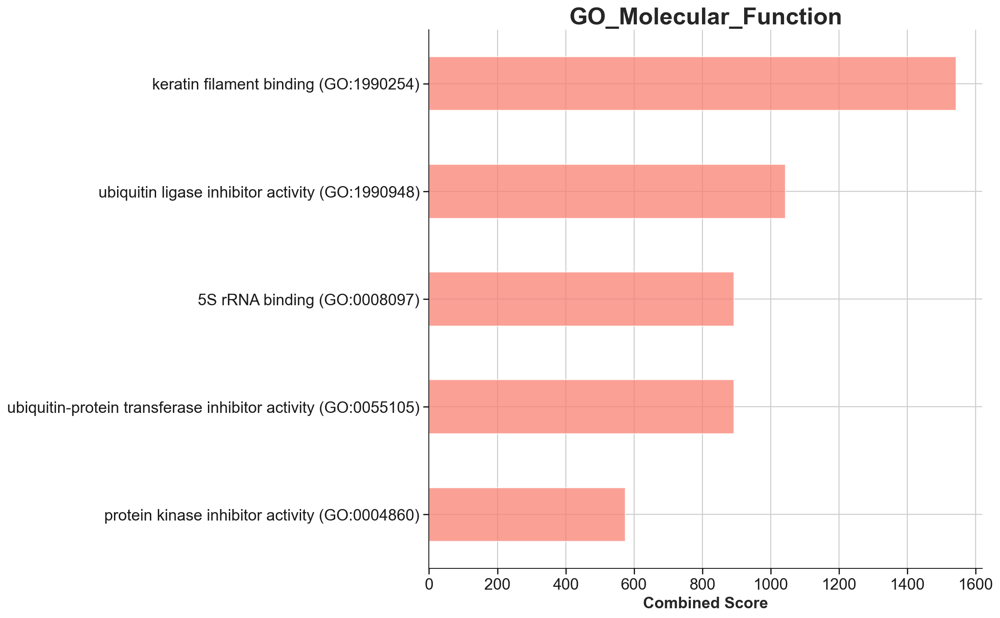

In [71]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN Downregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [72]:
enr_res_Old_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [73]:
significant_terms.shape

(7, 10)

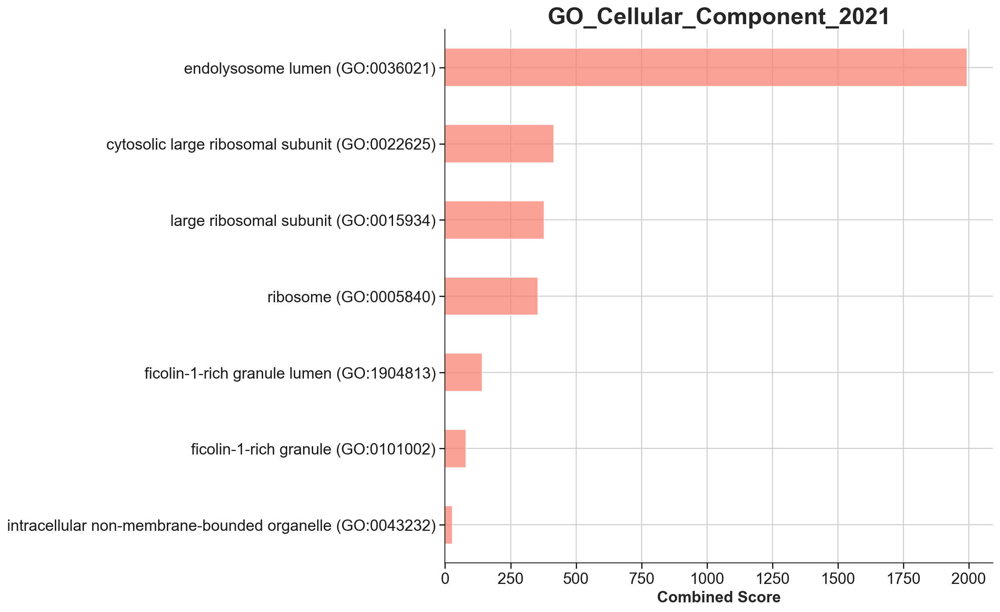

In [74]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN Downregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [75]:
enr_res_Old_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
2022-05-05 12:51:06,534 Warning: No enrich terms using library KEGG_2019_Mouse when cutoff = 0.05


In [76]:
significant_terms.shape

(0, 10)

In [77]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN Downregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

IndexError: index 0 is out of bounds for axis 0 with size 0

In [78]:
enr_res_Old_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10ra_vs_DN_significantly_downregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

/home/LULAB/pantovski/.conda/envs/general/lib/python3.8/site-packages/gseapy/enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)


In [79]:
significant_terms.shape

(2, 10)

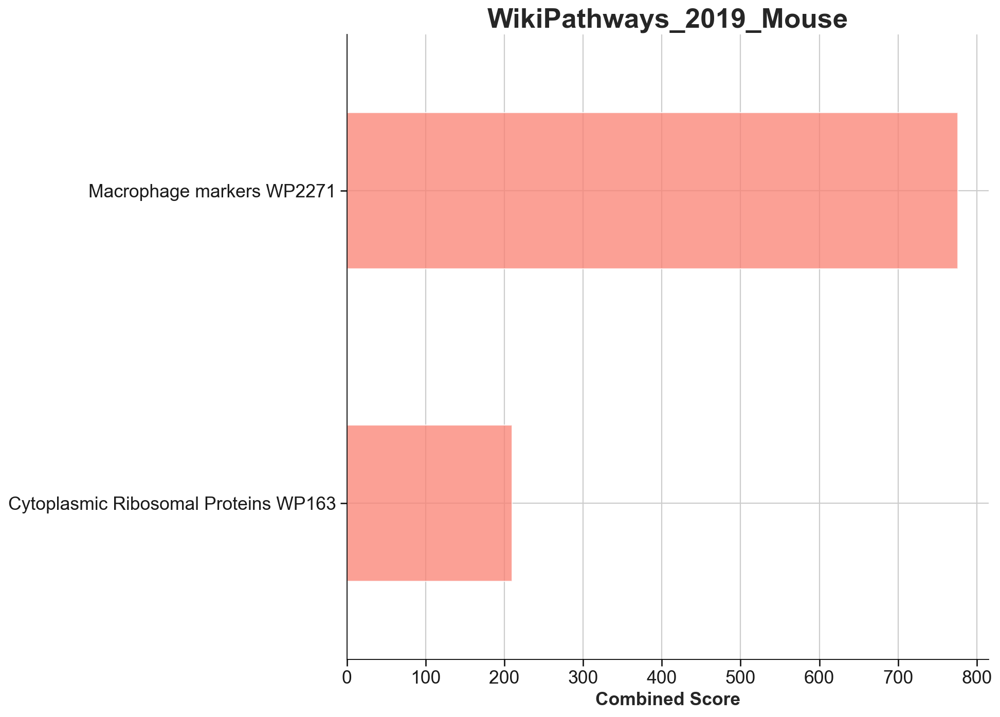

In [80]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10ra vs DN Downregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [81]:
sc.tl.rank_genes_groups(Old_naive_Ambient_RNA_cleaned_HSC, 'IL10', groups = ['IL10_Old_naive'], reference = 'DN_Old_naive', method='wilcoxon', corr_method='bonferroni', key_added = 'wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10_vs_DN', use_raw=True)
result = Old_naive_Ambient_RNA_cleaned_HSC.uns['wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10_vs_DN']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals', 'pvals_adj']}).head(10)

,IL10_Old_naive_n,IL10_Old_naive_p
0,Ocrl,1.0
1,Eif2a,1.0
2,Ppt1,1.0
3,Parp1,1.0
4,Ncoa7,1.0
5,Patz1,1.0
6,Serpina3g,1.0
7,Hhex,1.0
8,Mfsd10,1.0
9,Stat1,1.0


In [82]:
volcano_Old_naive_Ambient_RNA_cleaned_HSC = sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group=None, key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10_vs_DN')
volcano_Old_naive_Ambient_RNA_cleaned_HSC.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_beforehand.csv")

In [83]:
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered = volcano_Old_naive_Ambient_RNA_cleaned_HSC[volcano_Old_naive_Ambient_RNA_cleaned_HSC['pvals_adj'] < 0.05]
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.reset_index(inplace=True, drop=True)
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_005_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_beforehand.csv")
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered

,names,scores,logfoldchanges,pvals,pvals_adj,log_pvals_adj


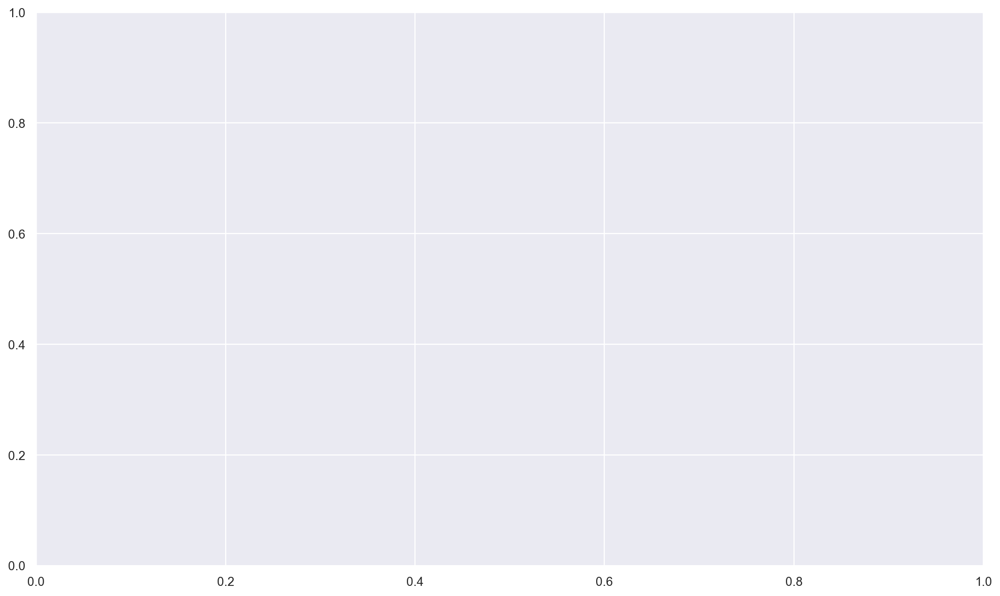

In [84]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered, x='logfoldchanges', y= 'log_pvals_adj')
for line in range(0,volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.shape[0]):
     plt.text(volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.logfoldchanges[line], volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.log_pvals_adj[line], volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.names[line])
plt.show()

In [85]:
import gseapy
gene_set_names = gseapy.get_library_name(organism='Mouse')

In [86]:
glist_Old_naive = sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group='IL10_Old_naive', key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10_vs_DN', pval_cutoff=0.05, log2fc_min=0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Old_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

Exception: Error analyzing gene list

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Upregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Upregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Upregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Upregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_upregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Upregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [ ]:
glist_Old_naive = sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group='IL10_Old_naive', key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10_vs_DN', pval_cutoff=0.05, log2fc_max=-0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Old_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Downregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Downregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Downregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Downregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_DN_significantly_downregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Downregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [87]:
sc.tl.rank_genes_groups(Old_naive_Ambient_RNA_cleaned_HSC, 'IL10', groups = ['IL10_Old_naive'], reference = 'IL10ra_Old_naive', method='wilcoxon', corr_method='bonferroni', key_added = 'wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra')
result = Old_naive_Ambient_RNA_cleaned_HSC.uns['wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals', 'pvals_adj']}).head(10)

,IL10_Old_naive_n,IL10_Old_naive_p
0,Ocrl,1.0
1,Hsp90ab1,1.0
2,Parp1,1.0
3,Ppt1,1.0
4,Serpina3g,1.0
5,Snrpb2,1.0
6,Pfdn1,1.0
7,Mfsd10,1.0
8,Syce2,1.0
9,Eif2a,1.0


In [88]:
volcano_Old_naive_Ambient_RNA_cleaned_HSC = sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group=None, key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra')
volcano_Old_naive_Ambient_RNA_cleaned_HSC.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_beforehand.csv")

In [89]:
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered = volcano_Old_naive_Ambient_RNA_cleaned_HSC[volcano_Old_naive_Ambient_RNA_cleaned_HSC['pvals_adj'] < 0.05]
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered['log_pvals_adj'] = -np.log10(volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered['pvals_adj'])
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.reset_index(inplace=True, drop=True)
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_005_DGE_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_regress_combat_beforehand.csv")
volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered

,names,scores,logfoldchanges,pvals,pvals_adj,log_pvals_adj


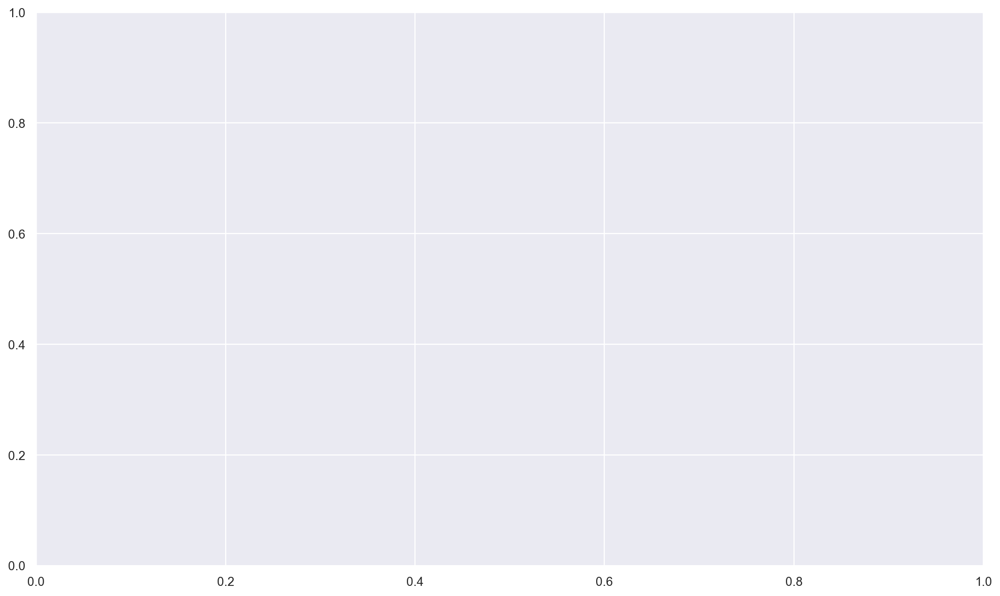

In [90]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

sns.set(rc={"figure.figsize":(15, 9)})

sns.scatterplot(data=volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered, x='logfoldchanges', y= 'log_pvals_adj')
for line in range(0,volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.shape[0]):
     plt.text(volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.logfoldchanges[line], volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.log_pvals_adj[line], volcano_Old_naive_Ambient_RNA_cleaned_HSC_filtered.names[line])
plt.show()

In [91]:
import gseapy
gene_set_names = gseapy.get_library_name(organism='Mouse')

In [92]:
glist_Old_naive = sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group='IL10_Old_naive', key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra', pval_cutoff=0.05, log2fc_min=0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Old_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

Exception: Error analyzing gene list

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Upregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Upregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Upregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Upregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_upregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Upregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))

In [ ]:
glist_Old_naive = sc.get.rank_genes_groups_df(Old_naive_Ambient_RNA_cleaned_HSC, group='IL10_Old_naive', key='wilcoxon_bonferroni_Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra', pval_cutoff=0.05, log2fc_max=-0.000000000001)['names'].squeeze().str.strip().tolist()

enr_res_Old_naive_Ambient_RNA_cleaned_process = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Biological_Process_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_process.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_GO_BP_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Downregulated DGEs GO BP.png')

gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Biological_Process', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_function = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Molecular_Function_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_function.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_GO_MF_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Molecular_Function', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Downregulated DGEs GO MF.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Molecular_Function', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_cell_component = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['GO_Cellular_Component_2021'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_cell_component.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_GO_CC_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='GO_Cellular_Component_2021', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Downregulated DGEs GO CC.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='GO_Cellular_Component_2021', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_KEGG = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['KEGG_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_KEGG.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_KEGG_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='KEGG_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Downregulated DGEs KEGG.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='KEGG_2019_Mouse', figsize=(10,10))

In [ ]:
enr_res_Old_naive_Ambient_RNA_cleaned_WIKI = gseapy.enrichr(gene_list=glist_Old_naive, organism='Mouse', gene_sets=['WikiPathways_2019_Mouse'], description='pathway', cutoff = 0.05)

significant_terms = enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d[enr_res_Old_naive_Ambient_RNA_cleaned_WIKI.res2d['Adjusted P-value'] < 0.05]
significant_terms.to_csv("/store/Projects/pantovski/IL10/Old_naive/write/Ambient_RNA_Cleaned/Old_naive_Ambient_RNA_cleaned_IL10_vs_IL10ra_significantly_downregulated_DGEs_WIKI_005_terms_join_inner_200_3_10_5_scrublet_no_mt_2_UMI_5_percent_combat_regress_beforehand.csv")

In [ ]:
significant_terms.shape

In [ ]:
gseapy.barplot(significant_terms, column='Combined Score', top_term=30, title='WikiPathways_2019_Mouse', figsize=(10,10), ofname='/store/Projects/pantovski/IL10/GSEA_and_GO_figures/Ambient_RNA_Cleaned/Old naive IL10 vs DN Downregulated DGEs WIKI.png')

gseapy.barplot(significant_terms, top_term=30, column='Combined Score', title='WikiPathways_2019_Mouse', figsize=(10,10))